# About Dataset

## Objective
To categorise the countries using socio-economic and health factors that determine the overall development of the country.

## Problem Statement
HELP International have been able to raise around $ 10 million. Now the CEO of the NGO needs to decide how to use this money strategically and effectively. So, CEO has to make decision to choose the countries that are in the direst need of aid. Hence, your Job as a Data scientist is to categorise the countries using some socio-economic and health factors that determine the overall development of the country. Then you need to suggest the countries which the CEO needs to focus on the most.

In this report, we will be going through 4 different clustering method in order to identify the clusters within the data:
1. K-Means with PCA and without PCA
2. Hierarchical clustering with PCA
3. Mean shift clustering with PCA
4. DBSCAN with PCA

We will also take a look at whether feature transformation will effect the distribution of the data. However, we will not be using feature transformed data in the clustering.

# Import Neccesary Libraries

In [72]:
import pandas as pd
import numpy as np
from scipy import stats

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.cluster.hierarchy import dendrogram, linkage

# Config
pd.options.display.float_format = '{:.3f}'.format
%matplotlib inline
np.set_printoptions(precision=3)

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', 0)

## inline backend will render higher res images/plots
%config InlineBackend.figure_format = 'retina'

# Model libraries
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, MeanShift, estimate_bandwidth
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as hcluster
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
#from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Standardization & Normalization
from sklearn.preprocessing import StandardScaler, FunctionTransformer, MinMaxScaler
from scipy.stats import boxcox

# Dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Import the Dataset

In [2]:
df = pd.read_csv('country_data/Country-data.csv')
data_info = pd.read_csv('country_data/data-dictionary.csv').set_index(['Column Name'])

## Dataset Feature Detail

In [3]:
data_info

,Description
Column Name,
country,Name of the country
child_mort,Death of children under 5 years of age per 1000 live births
exports,Exports of goods and services per capita. Given as %age of the GDP per capita
health,Total health spending per capita. Given as %age of GDP per capita
imports,Imports of goods and services per capita. Given as %age of the GDP per capita
Income,Net income per person
Inflation,The measurement of the annual growth rate of the Total GDP
life_expec,The average number of years a new born child would live if the current mortality patterns are to remain the same
total_fer,The number of children that would be born to each woman if the current age-fertility rates remain the same.


In [4]:
df.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.200,10.000,7.580,44.900,1610,9.440,56.200,5.820,553
1,Albania,16.600,28.000,6.550,48.600,9930,4.490,76.300,1.650,4090
2,Algeria,27.300,38.400,4.170,31.400,12900,16.100,76.500,2.890,4460
3,Angola,119.000,62.300,2.850,42.900,5900,22.400,60.100,6.160,3530
4,Antigua and Barbuda,10.300,45.500,6.030,58.900,19100,1.440,76.800,2.130,12200


In [5]:
# Dataframe details
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


All the columns have 167 rows, there seems to be no null data, lets confirm if this is true

In [6]:
# lets confirm if there is no null value
df.isna().sum()

country       0
child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

from df.info(), we can see that the column 'country' is the only column that is non-numerical. The other columns are numerical in nature either float or integer datatype.

In [7]:
df.shape

(167, 10)

In [8]:
# Lets check if the country column are all unique
df.country.nunique()

167

There are 167 rows in the dataset and 10 columns and each rows represent a different country

In [9]:
# let take a look at the distribution of the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
child_mort,167.000,38.270,40.329,2.600,8.250,19.300,62.100,208.000
exports,167.000,41.109,27.412,0.109,23.800,35.000,51.350,200.000
health,167.000,6.816,2.747,1.810,4.920,6.320,8.600,17.900
imports,167.000,46.890,24.210,0.066,30.200,43.300,58.750,174.000
income,167.000,17144.689,19278.068,609.000,3355.000,9960.000,22800.000,125000.000
inflation,167.000,7.782,10.571,-4.210,1.810,5.390,10.750,104.000
life_expec,167.000,70.556,8.893,32.100,65.300,73.100,76.800,82.800
total_fer,167.000,2.948,1.514,1.150,1.795,2.410,3.880,7.490
gdpp,167.000,12964.156,18328.705,231.000,1330.000,4660.000,14050.000,105000.000


# Exploratory Data Analysis

In [10]:
# Create helper function
def multi_subplot(n_cols, df, plotFn=None, **kwargs):
    n_rows=(len(df.columns)-1)//n_cols+1
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols*7, n_rows*5))
    axes = axes.ravel()
    for col, ax in zip(df.columns, axes):
        if plotFn:
            plotFn(data=df, ax=ax, x=df[col], **kwargs)
            plt.title(col)
        else:
            df[col].hist(ax=ax, ec='skyblue', facecolor='powderblue', lw=2)
            ax2 = df[col].plot.kde(ax=ax, secondary_y=True, title=f'{col}, skew: {df[col].skew():.2f}')
            ax2.set_ylim(0)
    fig.tight_layout()
    plt.show()

## Univariate Analysis

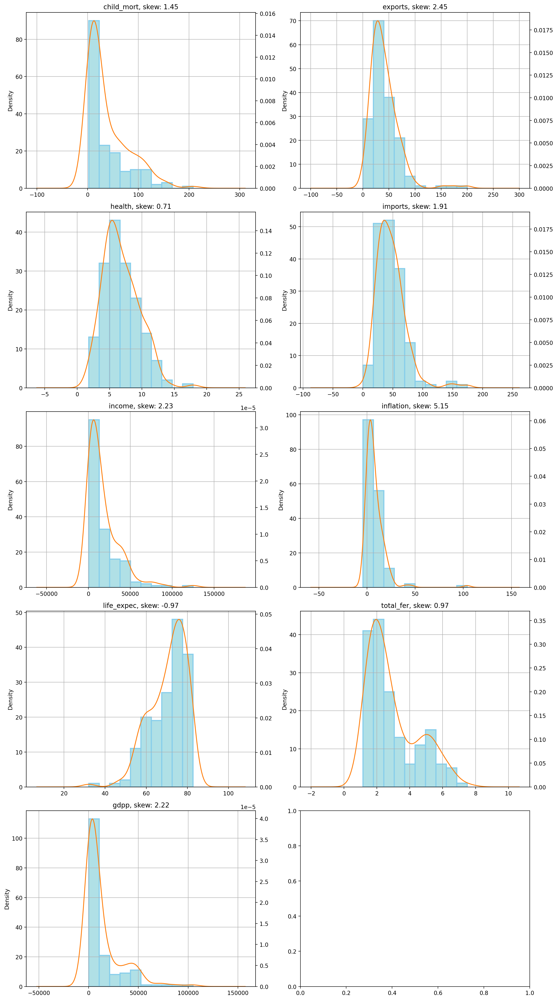

In [11]:
# Plot the KDE and hist
df_numeric = df.select_dtypes(exclude='object')
multi_subplot(2, df_numeric)

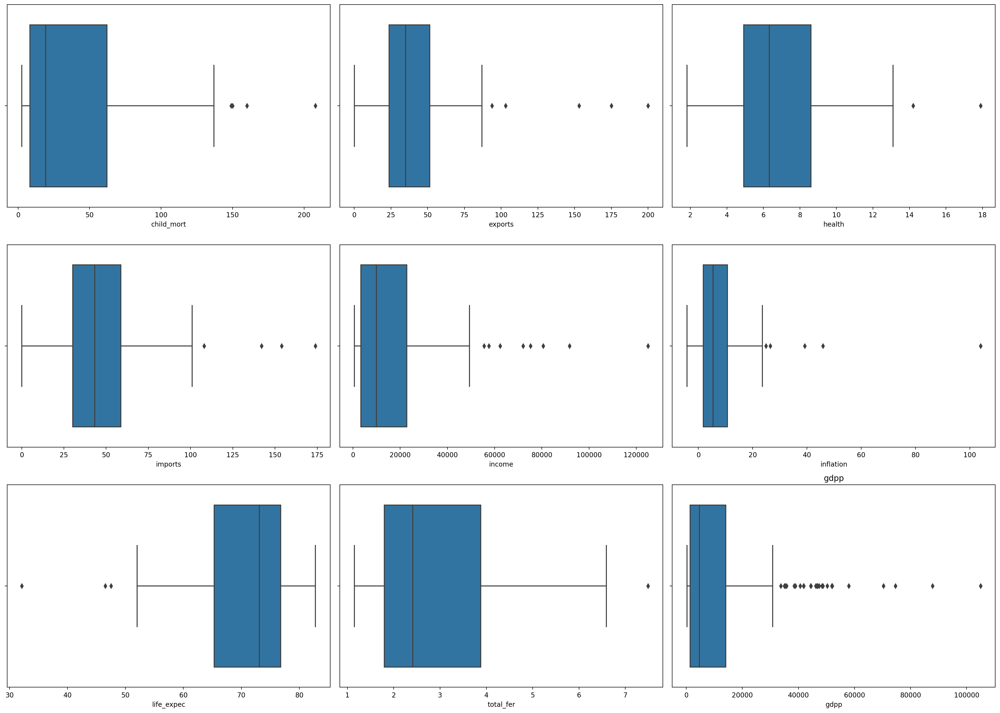

In [12]:
# Boxplot
multi_subplot(3, df_numeric, sns.boxplot)

From the chart above, we can see child_mort, exports, imports, income, gdpp and inflation columns are highly skew. 

There are many outliers for all other columns except for child_mort, health, import, total_fer, life_expec and inflation which has only some outliers.

We can try to improve the distribution by log transformation. 

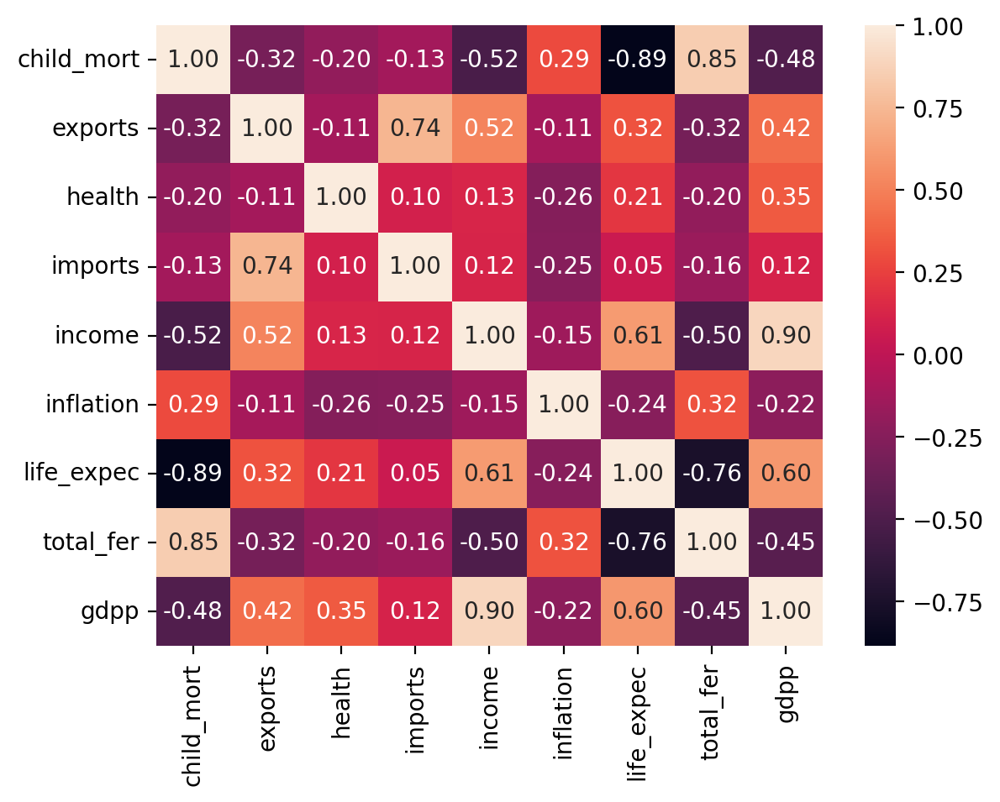

In [13]:
# Lets see the correlation between the features
sns.heatmap(df.corr(), annot=True, fmt='.2f')
plt.show()

We can see from the correlation matrix that the following relationship applies:
- child_mort is highly positive correlated with total_fer
- income is highly positive correlated with gdpp
- exports is highly positive correlated with imports
- life_expec is highly negative correlated with child_mort
- total_fer is highly negative correlated with life_expec
- life_expec is highly positive correlated with gdpp

In [14]:
# Lets plot a world map to get a more clearer picture on each features
for col in df_numeric.columns:
    fig = px.choropleth(data_frame=df, 
                        locationmode='country names', 
                        locations='country', 
                        color=col, 
                        title=f'{col} rate by countries')
    fig.show()

## Bivariate Analysis

<Figure size 2000x4000 with 0 Axes>

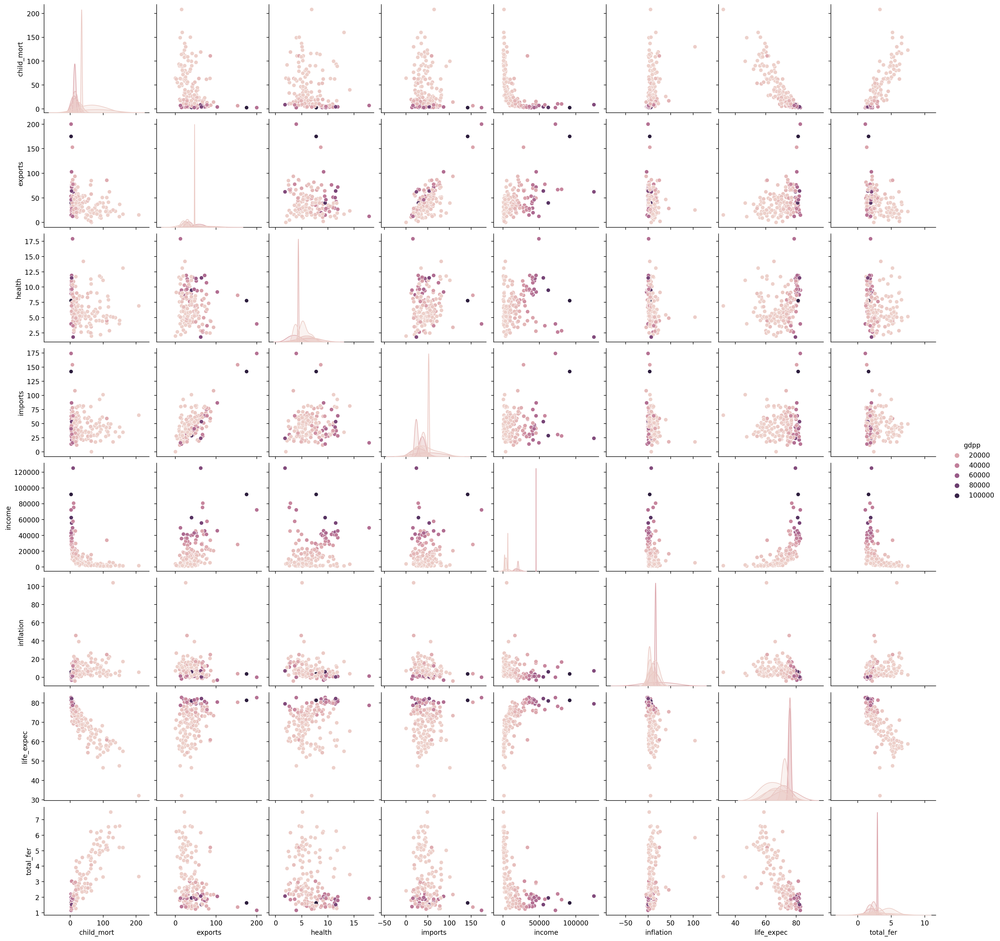

In [15]:
# Here we plot each features against gdpp to gain a better understanding of each feature relation with gdpp.

plt.figure(figsize=(20, 40))
sns.pairplot(df, hue='gdpp')
plt.show()

from the above, we can observe the following:
- child_mort and total_fer has a somewhat linear relationship
- exports and imports has a linear relationship
- life_expec and total_fer has a somewhat inverse linear relationship
- income and gdpp is highly correlated, with more income, the gdpp also increases which can be seen from the darker color points on the upper segment.
- from the export rows, we can see that higher exports contributes to better overall gdpp for the country.
- from the child_mort rows, if the country has higher gdpp also shows that there are less child mortality rate.
- from the health and income rows, we see that countries with higher gdpp tend to spend more on health as they have higher income which makes sense since country with higher gdpp has lower child_mort rates as they undergo more frequently health checkups.

## Feature Transformation

In [16]:
skew_val = df[df.columns[df.dtypes!=np.object]].skew()
skew_cols = skew_val.sort_values(ascending=False).to_frame().rename(columns={0:'Skew'})
skew_cols

,Skew
inflation,5.154
exports,2.446
income,2.231
gdpp,2.218
imports,1.905
child_mort,1.451
total_fer,0.967
health,0.706
life_expec,-0.971


In [17]:
# lets try to transform using logarithm to reduce the skewness
df_transform_numeric_log = np.log1p(df_numeric.copy())
df_transform_log = pd.concat([df.iloc[:, 0], df_transform_numeric_log], axis=1)
df_transform_log.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,4.513,2.398,2.149,3.826,7.385,2.346,4.047,1.920,6.317
1,Albania,2.868,3.367,2.022,3.904,9.203,1.703,4.348,0.975,8.317
2,Algeria,3.343,3.674,1.643,3.478,9.465,2.839,4.350,1.358,8.403
3,Angola,4.787,4.148,1.348,3.782,8.683,3.153,4.113,1.969,8.169
4,Antigua and Barbuda,2.425,3.839,1.950,4.093,9.857,0.892,4.354,1.141,9.409


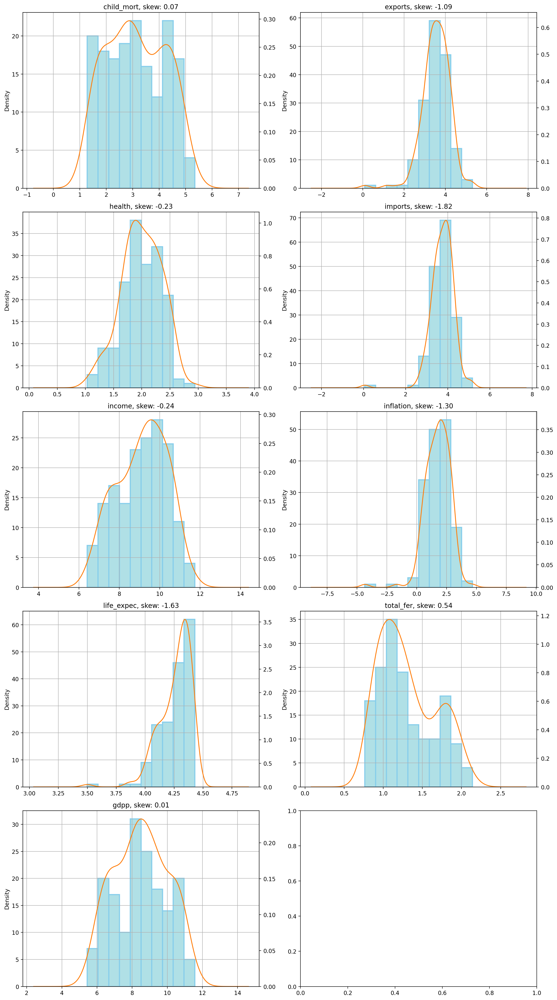

In [18]:
# Lets plot the KDE & hist again with the transformed data
multi_subplot(2, df_transform_numeric_log)

We can see the skewness has reduced and the data are beginning to look more like a normal distribution

Since we have negative values, boxcox transformation will not work.

# Modelling

## Data Scaling

In [19]:
scaler = StandardScaler()
trf = FunctionTransformer(func=np.log1p)
df_sc = scaler.fit_transform(df_numeric)
df_scaled = pd.DataFrame(np.c_[df.iloc[:, 0], df_sc], columns=df.columns)
df_scaled.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,1.292,-1.138,0.279,-0.082,-0.808,0.157,-1.619,1.903,-0.679
1,Albania,-0.539,-0.480,-0.097,0.071,-0.375,-0.312,0.648,-0.860,-0.486
2,Algeria,-0.273,-0.099,-0.966,-0.642,-0.221,0.789,0.670,-0.038,-0.465
3,Angola,2.008,0.775,-1.448,-0.165,-0.585,1.387,-1.179,2.128,-0.516
4,Antigua and Barbuda,-0.696,0.161,-0.287,0.498,0.102,-0.602,0.704,-0.542,-0.042


## K-Means

In [20]:
km_list = list()
n_cluster = 10
for k in range(2, n_cluster):
    km = KMeans(n_clusters=k, random_state=42).fit(df_sc)
    labels = km.predict(df_sc)
    km_list.append(pd.Series({
        'clusters': k,
        'WCSS': km.inertia_,
        'sc': silhouette_score(df_sc, labels),
        'model': km,
        'labels': np.unique(labels)
    }))
km_list_df = pd.DataFrame(km_list)
km_list_df.set_index('clusters', inplace=True)
km_list_df

,WCSS,sc,model,labels
clusters,,,,
2,1050.215,0.287,"KMeans(n_clusters=2, random_state=42)","[0, 1]"
3,831.424,0.283,"KMeans(n_clusters=3, random_state=42)","[0, 1, 2]"
4,700.323,0.301,"KMeans(n_clusters=4, random_state=42)","[0, 1, 2, 3]"
5,620.163,0.299,"KMeans(n_clusters=5, random_state=42)","[0, 1, 2, 3, 4]"
6,571.999,0.235,"KMeans(n_clusters=6, random_state=42)","[0, 1, 2, 3, 4, 5]"
7,495.323,0.249,"KMeans(n_clusters=7, random_state=42)","[0, 1, 2, 3, 4, 5, 6]"
8,455.277,0.241,KMeans(random_state=42),"[0, 1, 2, 3, 4, 5, 6, 7]"
9,426.458,0.203,"KMeans(n_clusters=9, random_state=42)","[0, 1, 2, 3, 4, 5, 6, 7, 8]"


### Plot the Elbow Curve

[Text(0.5, 0, 'Cluster'), Text(0, 0.5, 'WCSS')]

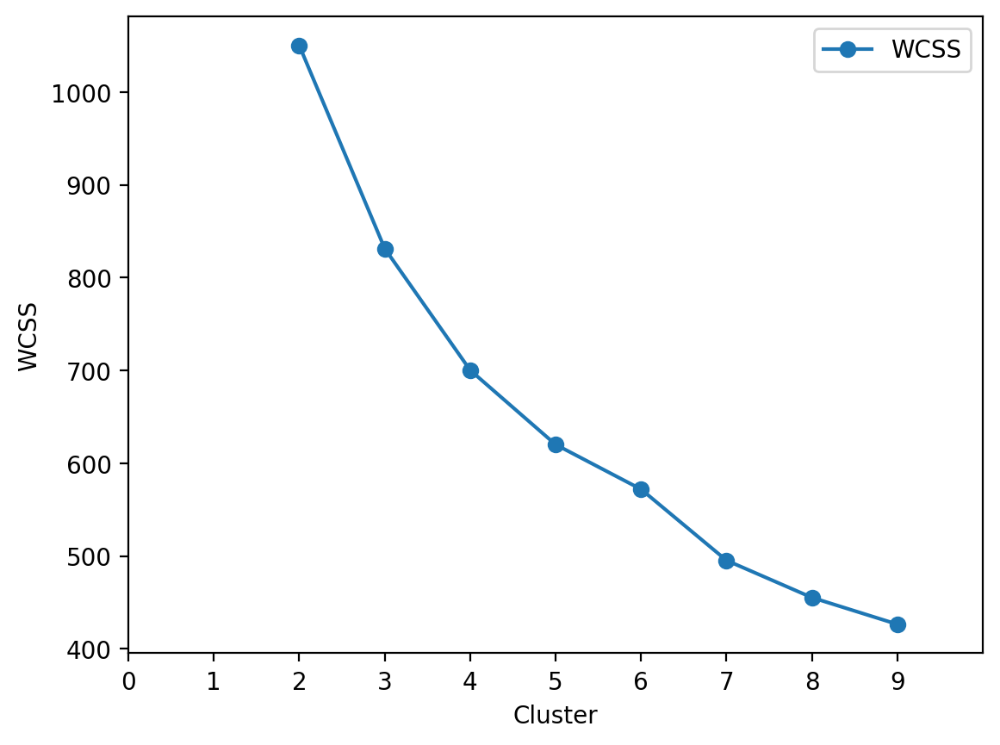

In [21]:
plot_data = (pd.concat(km_list, axis=1).T[['clusters', 'WCSS']].set_index('clusters'))
ax = plot_data.plot(marker='o', ls='-')
ax.set_xticks(range(0, 10))
ax.set_xlim(0, 10)
ax.set(xlabel='Cluster', ylabel='WCSS')

In [22]:
# Plot the elbow curve with yellowbrick visualizer
# We will not use this since yellowbrick has some import issue with latest scikit-learn
# visualize = KElbowVisualizer(KMeans(), k=(1, 10))
# visualize.fit(df_sc)
# visualize.poof()


### Plot the Silhouette Curve

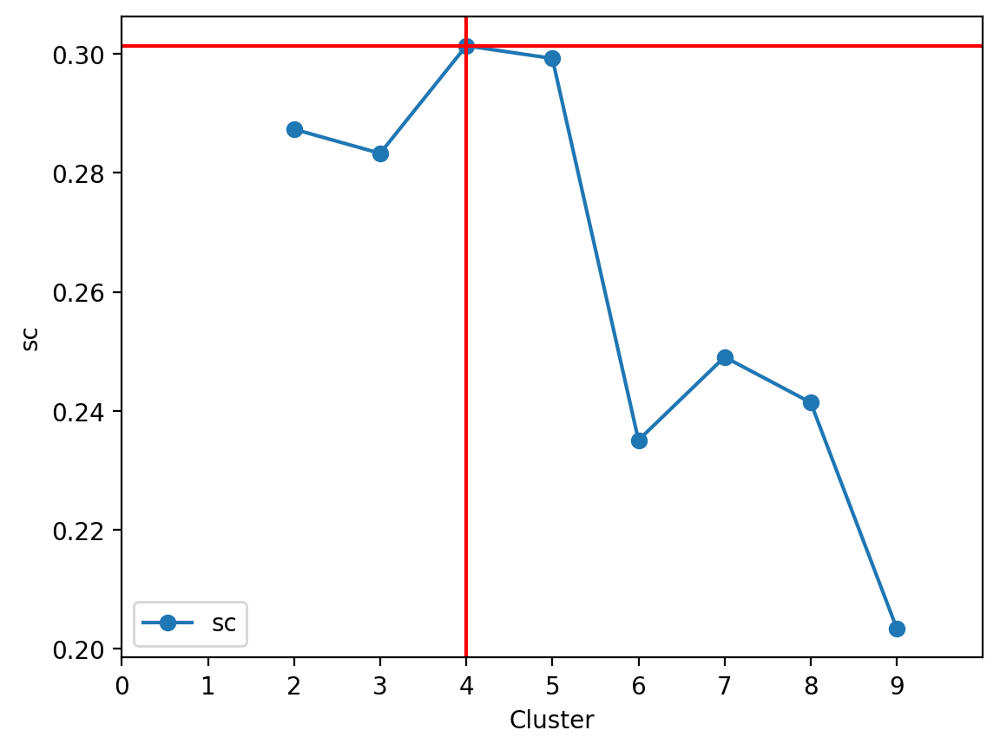

In [23]:
plot_data_sc = (pd.concat(km_list, axis=1).T[['clusters', 'sc']].set_index('clusters'))
ax = plot_data_sc.plot(marker='o', ls='-')
ax.set_xticks(range(0, 10))
ax.set_xlim(0, 10)
ax.set(xlabel='Cluster', ylabel='sc')
ax.axvline(plot_data_sc.index[np.argmax(plot_data_sc.sc)], c='r')
ax.axhline(plot_data_sc.sc[plot_data_sc.index[np.argmax(plot_data_sc.sc)]], c='r')
plt.show()

From the silhouette curve, we can see that n_cluster=4 is the best K. Lets check the labels for n_cluster=4

In [24]:
best_k = plot_data_sc.index[np.argmax(plot_data_sc.sc)]

# Check how many clusters are defined
best_km_labels=np.unique(*km_list_df[km_list_df.index == best_k].labels)
best_km_labels

array([0, 1, 2, 3], dtype=int32)

In [25]:
# Rerun the K-Means for the best k and generate a new dataframe
km_best = KMeans(n_clusters=best_k, random_state=42).fit(df_sc)

# add the labels to the dataframe
df_labeled = df.copy()
df_labeled['labels'] = km_best.labels_

df_labeled.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,labels
0,Afghanistan,90.200,10.000,7.580,44.900,1610,9.440,56.200,5.820,553,1
1,Albania,16.600,28.000,6.550,48.600,9930,4.490,76.300,1.650,4090,0
2,Algeria,27.300,38.400,4.170,31.400,12900,16.100,76.500,2.890,4460,0
3,Angola,119.000,62.300,2.850,42.900,5900,22.400,60.100,6.160,3530,1
4,Antigua and Barbuda,10.300,45.500,6.030,58.900,19100,1.440,76.800,2.130,12200,0


In [26]:
# lets group the countries by labels
df_labeled.groupby(['labels', 'country']).mean().sort_values('gdpp', ascending=True)

child_mort  exports  health  imports     income  \
labels country                                                             
1      Burundi          93.600      8.920    11.600  39.200   764.000      
       Liberia          89.300      19.100   11.800  92.600   700.000      
       Congo, Dem. Rep. 116.000     41.100   7.910   49.600   609.000      
       Niger            123.000     22.200   5.160   49.100   814.000      
       Sierra Leone     160.000     16.800   13.100  34.500   1220.000     
...                         ...        ...     ...      ...       ...      
2      Denmark          4.100       50.500   11.400  43.600   44000.000    
       Qatar            9.000       62.300   1.810   23.800   125000.000   
       Switzerland      4.500       64.000   11.500  53.300   55500.000    
       Norway           3.200       39.700   9.480   28.500   62300.000    
3      Luxembourg       2.800       175.000  7.770   142.000  91700.000    

                         inflation  life_expec  total_fer       gdpp  
labels country                                                        
1      Burundi          12.300     57.700      6.260      231.000     
       Liberia          5.470      60.800      5.020      327.000     
       Congo, Dem. Rep. 20.800     57.500      6.540      334.000     
       Niger            2.550      58.800      7.490      348.000     
       Sierra Leone     17.200     55.000      5.200      399.000     
...                       ...         ...        ...          ...     
2      Denmark          3.220      79.500      1.870      58000.000   
       Qatar            6.980      79.500      2.070      70300.000   
       Switzerland      0.317      82.200      1.520      74600.000   
       Norway           5.950      81.000      1.950      87800.000   
3      Luxembourg       3.620      81.300      1.630      105000.000  

[167 rows x 9 columns]

From the above, we can see that class 1 is the low income economies with low GDPP, followed by class 0 which is the low-middle income economies, class 2 which is the upper middle income economies and lastly class 3 which is the high income economies

In [27]:
# print out the country by labels for easier view
for lb in np.unique(df_labeled.labels):
    print(f'Label={lb} consist of the following countries:')
    print(df_labeled[df_labeled.labels == lb].country.to_list())
    print('-'*50)

Label=0 consist of the following countries:
['Albania', 'Algeria', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belize', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Brazil', 'Bulgaria', 'Cambodia', 'Cape Verde', 'Chile', 'China', 'Colombia', 'Costa Rica', 'Croatia', 'Czech Republic', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia', 'Fiji', 'Georgia', 'Grenada', 'Guatemala', 'Guyana', 'Hungary', 'India', 'Indonesia', 'Iran', 'Jamaica', 'Jordan', 'Kazakhstan', 'Kyrgyz Republic', 'Latvia', 'Lebanon', 'Libya', 'Lithuania', 'Macedonia, FYR', 'Malaysia', 'Maldives', 'Mauritius', 'Micronesia, Fed. Sts.', 'Moldova', 'Mongolia', 'Montenegro', 'Morocco', 'Myanmar', 'Nepal', 'Oman', 'Panama', 'Paraguay', 'Peru', 'Philippines', 'Poland', 'Romania', 'Russia', 'Samoa', 'Saudi Arabia', 'Serbia', 'Seychelles', 'Slovak Republic', 'Solomon Islands', 'Sri Lanka', 'St. Vincent and the Grenadines', 'Suriname'

<Figure size 2000x6000 with 0 Axes>

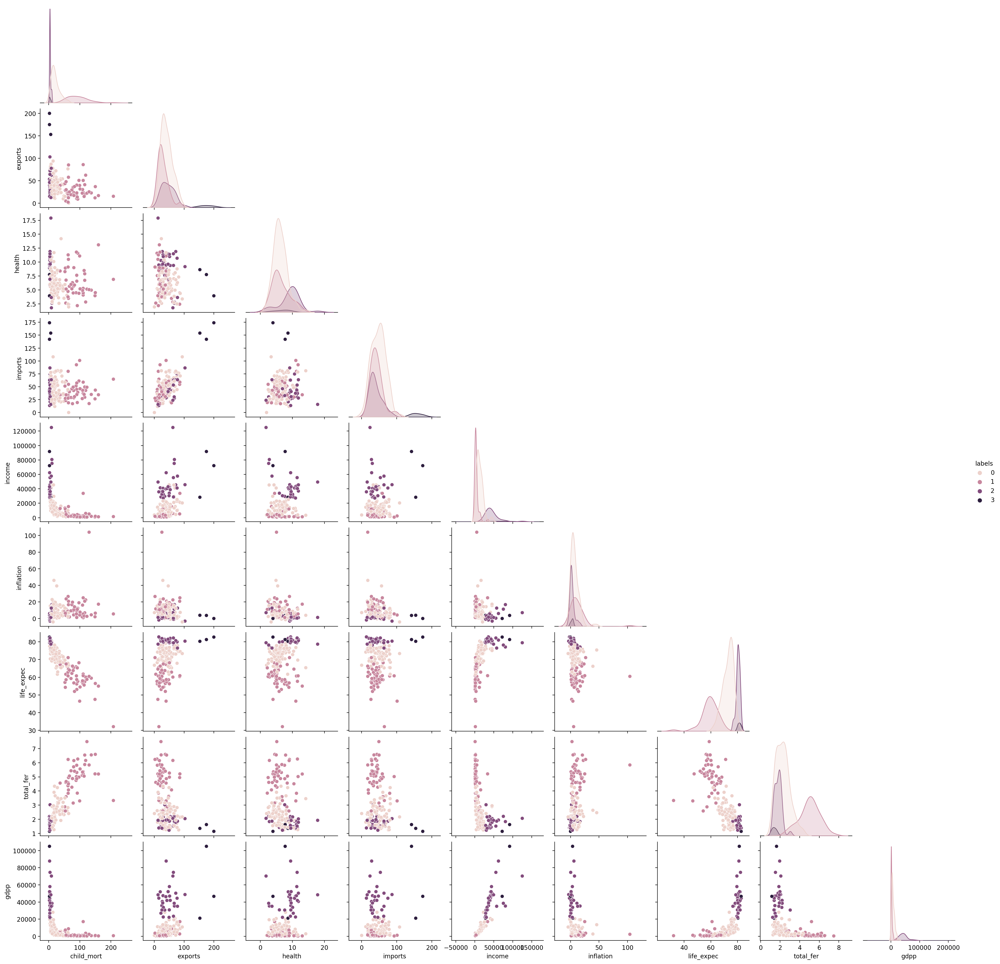

In [28]:
# Plot the K-means scatterplot

#multi_subplot(2,df_km_best.iloc[:, 1:], sns.scatterplot, hue='labels')
#g = sns.PairGrid(df_km_best, vars=df_numeric.columns, hue='labels', corner=True)
#g.map_offdiag(sns.scatterplot, alpha=0.5)
plt.figure(figsize=(20, 60))
sns.pairplot(df_labeled, hue='labels', corner=True)

In [29]:
# Plot the world map with the clusters
# According to the UN and World Bank, based on Gross national income (GNI) per capita, world economies can be classified into 4 groups, mainly high income, upper middle incoe, low middle income and low income economies
# According to Singstat, Singapore is a developing country, hence, we cannot group the 4 groups into develop, developing and underdeveloped country


cat = {'0': 'Low Middle Income Economies (Might Need Help)', '1': 'Low Income Economies (Need the Most Help)', '2': 'Upper Middle Income Economies/NIE (Little Help Needed)', '3': 'High Income Economies (No Help Needed)'}
fig = px.choropleth(data_frame=df_labeled, 
              locationmode='country names', 
              locations='country', 
              color=df_labeled['labels'].astype('string'), projection='equirectangular', color_discrete_sequence=['red', 'yellow', 'blue', 'green'])
fig.update_layout(font=dict(size=8), legend=dict(orientation='h'))
fig.for_each_trace(lambda t: t.update(name = cat[t.name],
                                      legendgroup = cat[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, cat[t.name])
                                     )
                  )

In [30]:
# African Countries that need help
cat = {'0': 'Low Middle Income Economies (Might Need Help)', '1': 'Low Income Economies (Need the Most Help)', '2': 'Upper Middle Income Economies/NIE (Little Help Needed)', '3': 'High Income Economies (No Help Needed)'}
fig = px.choropleth(data_frame=df_labeled, 
              locationmode='country names', 
              locations='country', 
              color=df_labeled['labels'].astype('string'), 
            projection='equirectangular', 
            color_discrete_sequence=['red', 'yellow', 'blue', 'green'],
            scope='africa',
            title='African Countries that need help')
fig.update_layout(font=dict(size=8), legend=dict(orientation='h'))
fig.for_each_trace(lambda t: t.update(name = cat[t.name],
                                      legendgroup = cat[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, cat[t.name])
                                     )
                  )

In [31]:
cat = {'0': 'Low Middle Income Economies (Might Need Help)', '1': 'Low Income Economies (Need the Most Help)', '2': 'Upper Middle Income Economies/NIE (Little Help Needed)', '3': 'High Income Economies (No Help Needed)'}
fig = px.choropleth(data_frame=df_labeled, 
              locationmode='country names', 
              locations='country', 
              color=df_labeled['labels'].astype('string'), 
            projection='equirectangular', 
            color_discrete_sequence=['red', 'yellow', 'blue', 'green'],
            scope='asia',
            title='Asia Countries that need help')
fig.update_layout(font=dict(size=8), legend=dict(orientation='h'))
fig.for_each_trace(lambda t: t.update(name = cat[t.name],
                                      legendgroup = cat[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, cat[t.name])
                                     )
                  )

We can see from the plot, asian countries and african countries are the region that need the most help compared to the america

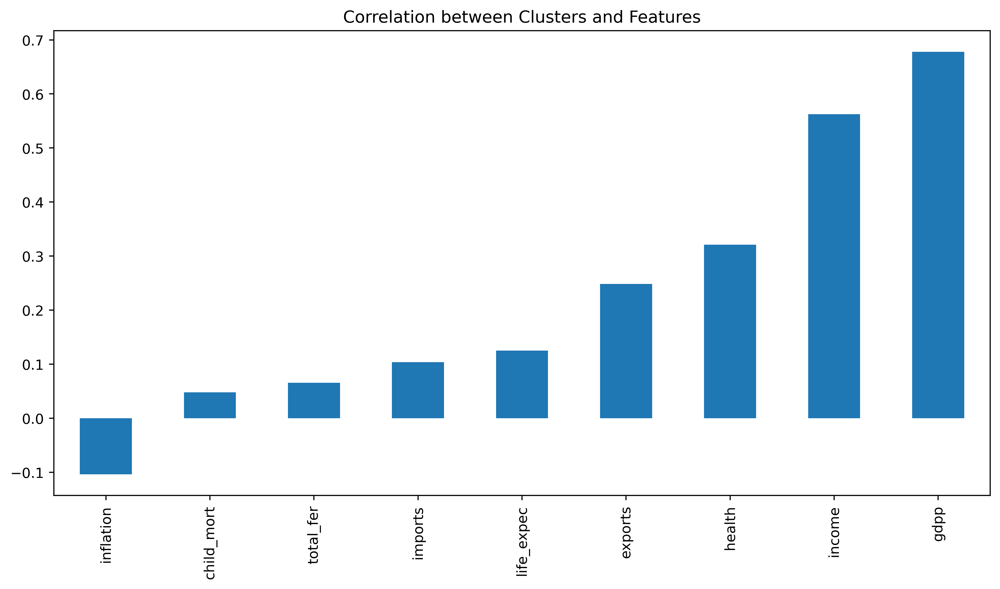

In [32]:
# Lets see the correlation between clusters and features
plt.figure(figsize=(12, 6), dpi=200)
df_labeled.corr()['labels'].iloc[:-1].sort_values().plot(kind='bar')
plt.title('Correlation between Clusters and Features')
plt.show()

## PCA
- Let see if applying PCA will have an effect of the clustering

Cumulative Explained Variance Ratio: [0.46  0.631 0.761 0.872 0.945 0.97  0.983 0.993 1.   ]


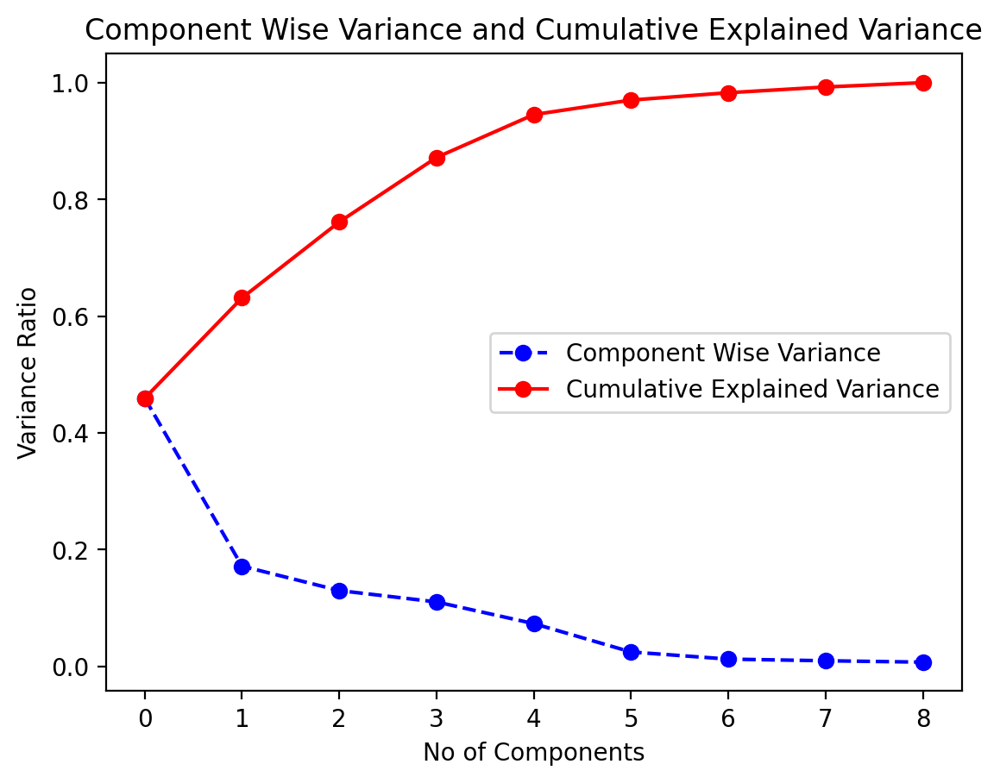

In [33]:
pca = PCA()
df_pca=pca.fit_transform(df_sc)

df_pca=pd.DataFrame(data=df_pca, columns=[f'PC{i+1}' for i in range(len(df_sc[0]))])

# See how much varaince can b explained using the pca
ax1=plt.plot(pca.explained_variance_ratio_, marker='o', color='b', linestyle='--', label='Component Wise Variance')
cumsum = np.cumsum(pca.explained_variance_ratio_)
print(f'Cumulative Explained Variance Ratio: {cumsum}')
plt.plot(cumsum, marker='o', color='r', label='Cumulative Explained Variance')
plt.title('Component Wise Variance and Cumulative Explained Variance')
plt.xlabel('No of Components')
plt.ylabel('Variance Ratio')
plt.legend()
plt.show()

In [34]:
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,-2.913,0.096,-0.718,1.005,-0.158,-0.255,0.383,0.415,-0.014
1,0.430,-0.588,-0.333,-1.161,0.175,0.085,0.249,-0.221,0.173
2,-0.285,-0.455,1.222,-0.868,0.156,-0.402,-0.087,-0.184,0.084
3,-2.932,1.696,1.525,0.840,-0.273,-0.548,-0.441,-0.356,-0.091
4,1.034,0.137,-0.226,-0.847,-0.193,-0.207,0.242,-0.024,0.094
...,...,...,...,...,...,...,...,...,...
162,-0.821,0.640,-0.390,-0.707,-0.396,0.009,-0.099,0.522,-0.498
163,-0.551,-1.234,3.101,-0.115,2.083,0.097,0.207,-0.079,-0.276
164,0.499,1.391,-0.239,-1.074,1.176,0.052,-0.144,-0.218,-0.037
165,-1.887,-0.109,1.110,0.056,0.618,-0.541,0.060,0.089,-0.096


In [35]:
# Typically eigenvalues with more than 95% of ratio fo variance are selected.
# Lets see what is min no of components required to achieve 95% explained variance
d = np.argmax(cumsum>=0.95)+1
print(f'We will use n_components={d} to achieve more than 95% explained variance ratio')

We will use n_components=6 to achieve more than 95% explained variance ratio


In [36]:
# Define 3d helper plot function
def plot_3d(X, y, title=None, xlabel=None, ylabel=None, zlabel=None):
    fig = plt.figure(1, figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d', elev=20, azim=150)
    for t in np.unique(y):
        ax.scatter(
            X[df['target'] == t, 0],
            X[df['target'] == t, 1],
            X[df['target'] == t, 2],
            cmap='viridis',
            edgecolor='k',
            s=40,
            alpha=0.5,
            label=iris.target_names[t]
        )
    
    ax.legend()
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.xaxis.set_ticklabels([])
    ax.set_ylabel(ylabel)
    ax.yaxis.set_ticklabels([])
    ax.set_zlabel(zlabel)
    ax.zaxis.set_ticklabels([])
    
    plt.show()
    

In [37]:
df_pca_selected = df_pca.iloc[:, :d]
df_pca_selected

,PC1,PC2,PC3,PC4,PC5,PC6
0,-2.913,0.096,-0.718,1.005,-0.158,-0.255
1,0.430,-0.588,-0.333,-1.161,0.175,0.085
2,-0.285,-0.455,1.222,-0.868,0.156,-0.402
3,-2.932,1.696,1.525,0.840,-0.273,-0.548
4,1.034,0.137,-0.226,-0.847,-0.193,-0.207
...,...,...,...,...,...,...
162,-0.821,0.640,-0.390,-0.707,-0.396,0.009
163,-0.551,-1.234,3.101,-0.115,2.083,0.097
164,0.499,1.391,-0.239,-1.074,1.176,0.052
165,-1.887,-0.109,1.110,0.056,0.618,-0.541


## K-Means with PCA

In [38]:
km_list_pca = list()
n_cluster_pca = 10
for k in range(2, n_cluster_pca):
    km = KMeans(n_clusters=k, random_state=42).fit(df_pca_selected)
    labels = km.predict(df_pca_selected)
    km_list_pca.append(pd.Series({
        'clusters': k,
        'WCSS': km.inertia_,
        'sc': silhouette_score(df_pca_selected, labels),
        'model': km,
        'labels': np.unique(labels)
    }))
km_list_pca_df = pd.DataFrame(km_list_pca)
km_list_pca_df.set_index('clusters', inplace=True)
km_list_pca_df

,WCSS,sc,model,labels
clusters,,,,
2,1005.736,0.296,"KMeans(n_clusters=2, random_state=42)","[0, 1]"
3,786.732,0.297,"KMeans(n_clusters=3, random_state=42)","[0, 1, 2]"
4,655.930,0.315,"KMeans(n_clusters=4, random_state=42)","[0, 1, 2, 3]"
5,576.383,0.314,"KMeans(n_clusters=5, random_state=42)","[0, 1, 2, 3, 4]"
6,508.350,0.249,"KMeans(n_clusters=6, random_state=42)","[0, 1, 2, 3, 4, 5]"
7,468.647,0.244,"KMeans(n_clusters=7, random_state=42)","[0, 1, 2, 3, 4, 5, 6]"
8,423.409,0.238,KMeans(random_state=42),"[0, 1, 2, 3, 4, 5, 6, 7]"
9,387.707,0.234,"KMeans(n_clusters=9, random_state=42)","[0, 1, 2, 3, 4, 5, 6, 7, 8]"


### Plot the Elbow Curve

[Text(0.5, 0, 'Cluster'), Text(0, 0.5, 'WCSS')]

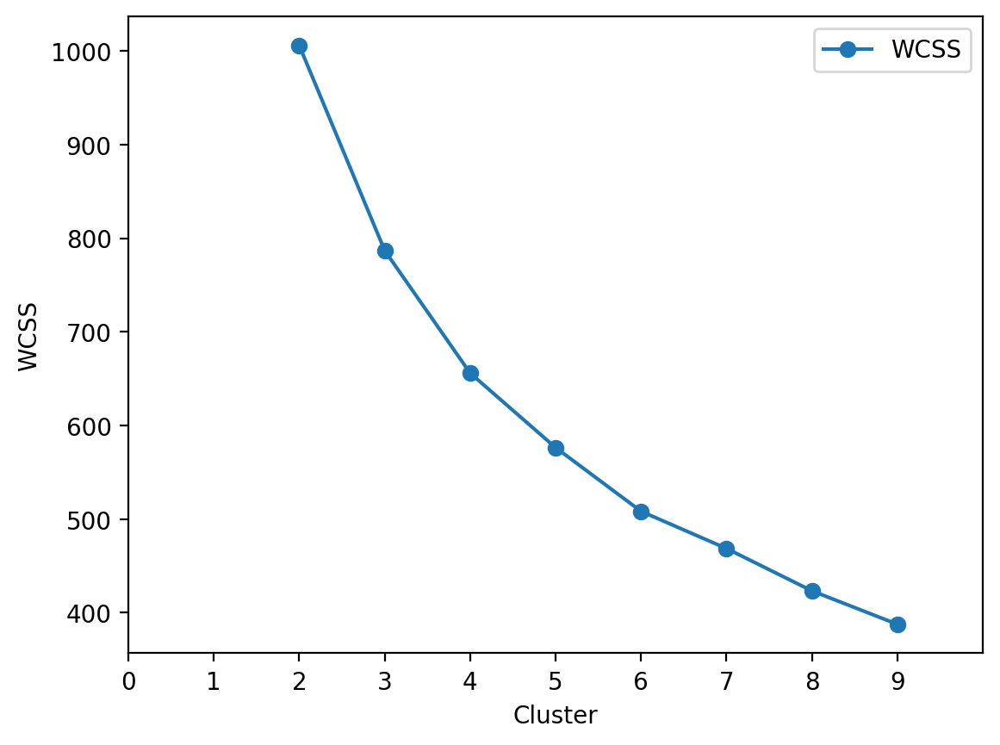

In [39]:
plot_data_pca = (pd.concat(km_list_pca, axis=1).T[['clusters', 'WCSS']].set_index('clusters'))
ax = plot_data_pca.plot(marker='o', ls='-')
ax.set_xticks(range(0, 10))
ax.set_xlim(0, 10)
ax.set(xlabel='Cluster', ylabel='WCSS')

### Plot the Silhouette Curve

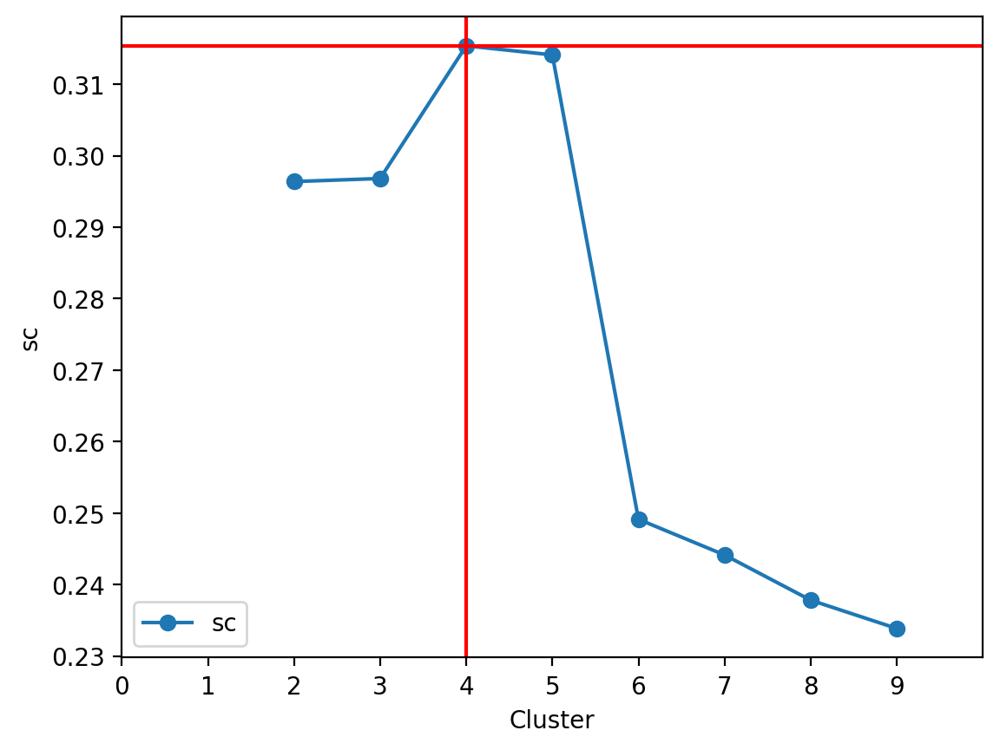

In [40]:
plot_data_pca_sc = (pd.concat(km_list_pca, axis=1).T[['clusters', 'sc']].set_index('clusters'))
ax = plot_data_pca_sc.plot(marker='o', ls='-')
ax.set_xticks(range(0, 10))
ax.set_xlim(0, 10)
ax.set(xlabel='Cluster', ylabel='sc')
ax.axvline(plot_data_pca_sc.index[np.argmax(plot_data_pca_sc.sc)], c='r')
ax.axhline(plot_data_pca_sc.sc[plot_data_pca_sc.index[np.argmax(plot_data_pca_sc.sc)]], c='r')
plt.show()

We can see that K Means with PCA also selected 4 clusters as the best K.

In [41]:
best_k_pca = plot_data_pca_sc.index[np.argmax(plot_data_pca_sc.sc)]

# Check how many clusters are defined
best_km_pca_labels=np.unique(*km_list_pca_df[km_list_pca_df.index == best_k_pca].labels)
best_km_pca_labels

array([0, 1, 2, 3], dtype=int32)

In [42]:
# Rerun the K-Means for the best k and generate a new dataframe
km_best_pca = KMeans(n_clusters=best_k_pca, random_state=42).fit(df_pca_selected)

# add the labels to the dataframe
df_labeled_pca = df.copy()
df_labeled_pca['labels'] = km_best_pca.labels_

df_labeled_pca.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,labels
0,Afghanistan,90.200,10.000,7.580,44.900,1610,9.440,56.200,5.820,553,1
1,Albania,16.600,28.000,6.550,48.600,9930,4.490,76.300,1.650,4090,2
2,Algeria,27.300,38.400,4.170,31.400,12900,16.100,76.500,2.890,4460,2
3,Angola,119.000,62.300,2.850,42.900,5900,22.400,60.100,6.160,3530,1
4,Antigua and Barbuda,10.300,45.500,6.030,58.900,19100,1.440,76.800,2.130,12200,2


In [43]:
# Lets check if there is any different in the assigned classes after using PCA
# print out the country by labels for easier view
for lb in np.unique(df_labeled_pca.labels):
    print(f'Label={lb} consist of the following countries:')
    print(df_labeled_pca[df_labeled_pca.labels == lb].country.to_list())
    print('-'*50)

Label=0 consist of the following countries:
['Luxembourg', 'Malta', 'Singapore']
--------------------------------------------------
Label=1 consist of the following countries:
['Afghanistan', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.', "Cote d'Ivoire", 'Equatorial Guinea', 'Eritrea', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Haiti', 'Iraq', 'Kenya', 'Kiribati', 'Lao', 'Lesotho', 'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Pakistan', 'Rwanda', 'Senegal', 'Sierra Leone', 'South Africa', 'Sudan', 'Tanzania', 'Timor-Leste', 'Togo', 'Uganda', 'Yemen', 'Zambia']
--------------------------------------------------
Label=2 consist of the following countries:
['Albania', 'Algeria', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belize', 'Bhutan'

In [44]:
# Lets compare the pca K-Mean labels and Normal K-Mean labels
print('Cluster Counts in df_labeled (Non PCA K-Mean):')
for i in np.unique(df_labeled.labels):
    print(f'cluster {i} contains {df_labeled[df_labeled.labels ==i].shape[0]} Countries')

print('-'*50)

print('Cluster Count in df_labeled_pca (PCA with K-means):')
for j in np.unique(df_labeled_pca.labels):
    print(f'cluster {j} contains {df_labeled_pca[df_labeled_pca.labels ==j].shape[0]} Countries')

Cluster Counts in df_labeled (Non PCA K-Mean):
cluster 0 contains 87 Countries
cluster 1 contains 47 Countries
cluster 2 contains 30 Countries
cluster 3 contains 3 Countries
--------------------------------------------------
Cluster Count in df_labeled_pca (PCA with K-means):
cluster 0 contains 3 Countries
cluster 1 contains 47 Countries
cluster 2 contains 87 Countries
cluster 3 contains 30 Countries


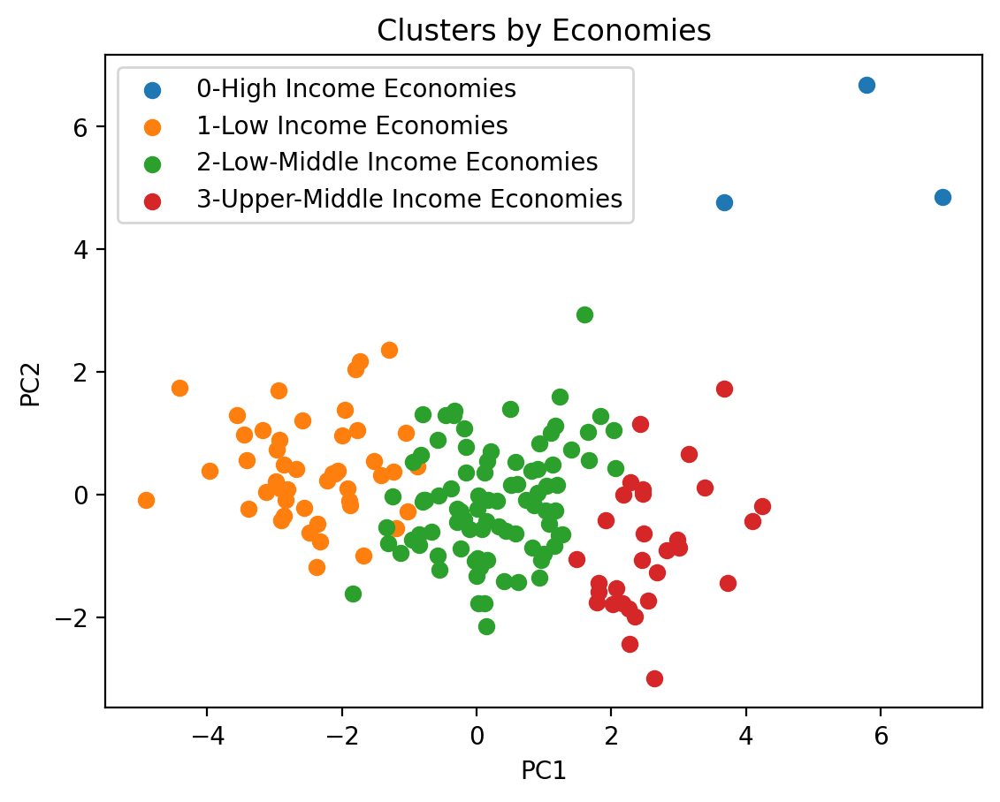

In [45]:
# Plot the first 2 PC
df_pca_plot = pd.DataFrame(np.c_[df_pca_selected.copy(), km_best_pca.labels_], columns=df_pca_selected.columns.to_list() + ['clusters'])
df_pca_plot.clusters = df_pca_plot.clusters.astype('int')
label_text = [
    'High Income Economies',
    'Low Income Economies',
    'Low-Middle Income Economies',
    'Upper-Middle Income Economies'
]
for cls in np.unique(df_pca_plot.clusters):
    plt.scatter(df_pca_plot[df_pca_plot.clusters == cls].PC1, df_pca_plot[df_pca_plot.clusters == cls].PC2, label=f'{cls}-{label_text[cls]}')
plt.legend()
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Clusters by Economies')
plt.show()

Conclusion: We can see that K-Means with PCA did not improve the clustering. PCA K-Means still indicates the same number of countries for each clusters similar for non-PCA K-means. The only changes is that now the clusters have change as follow with the PCA:
- cluster 0 represents the high income economies (previously was cluster 3 for the non_PCA K-mean)
- cluster 1 represents the low income economies (previously was cluster 0 for the non-PCA K-mean)
- cluster 2 represents the low-middle income economies (previously was cluster 0 for the non-PCA K-means)
- cluster 3 represents the upper-middle income economies. (previously was clusters 2 for the non-PCA K-means)

PCA did however provide us a clearer visualization the number of clusters as shown in above scatterplot by making a 2D plots instead of 8 different features, which is difficult to visualize

We can expect that the visualization plot will be similar. Hence, we will skip this step

## Hierarchical Clustering

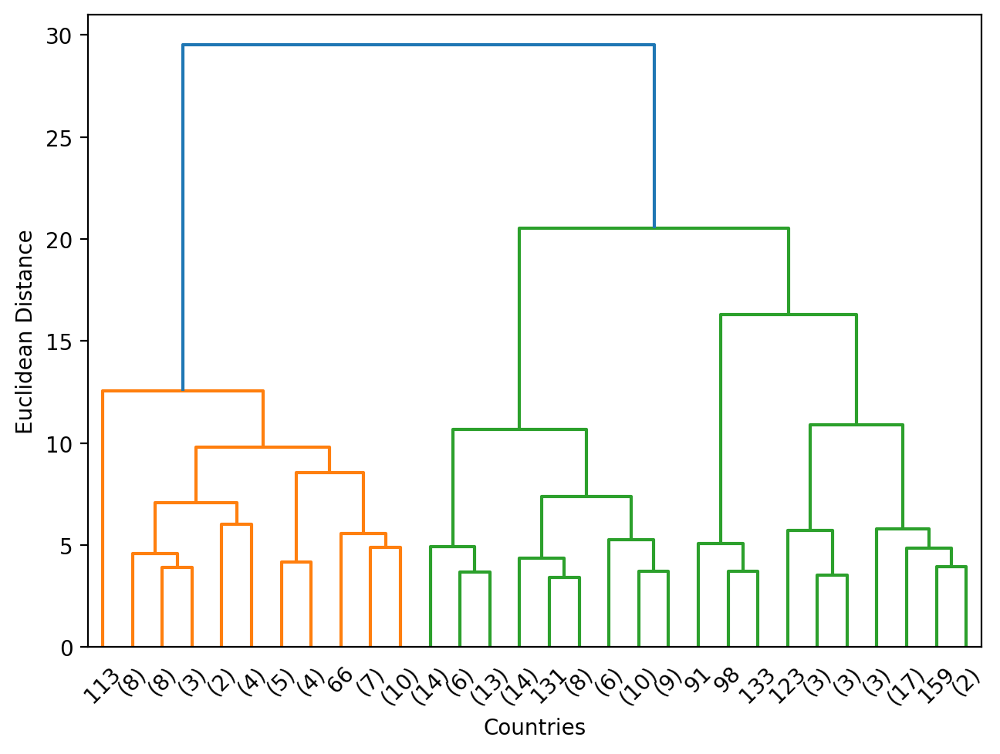

In [46]:
linkage_data = hcluster.linkage(df_pca_selected, method='ward', metric='euclidean')
dg = dendrogram(linkage_data, show_leaf_counts=True, p=30, truncate_mode='lastp')
plt.tight_layout()
plt.xlabel('Countries')
plt.ylabel('Euclidean Distance')
plt.show()

from hierarchical clustering, it seems that the countries were divided into 3 categories (shown by 3 branches), mainly:
1. Developed countries
2. Underdeveloped countries
3. Developing countries

This inference differs from the K-mean clustering which has 4 clusters.

In [47]:
hc = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
y_hc = hc.fit_predict(df_pca_selected)
np.unique(y_hc)

array([0, 1, 2])

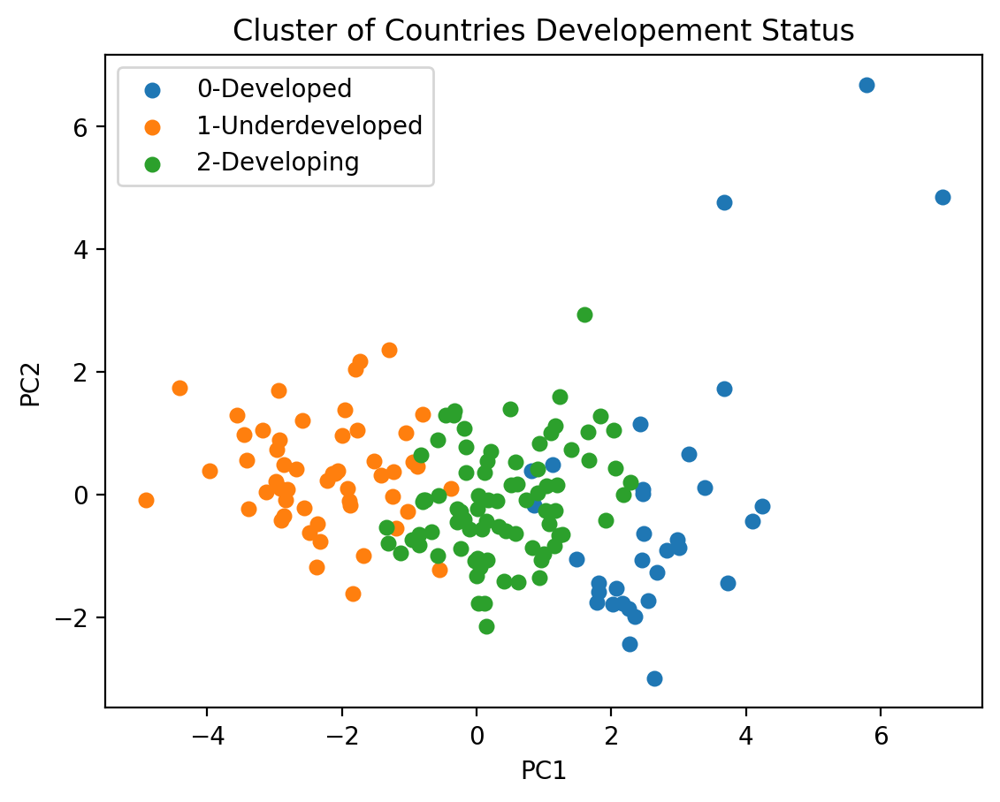

In [48]:
dev_status = ['Developed', 'Underdeveloped', 'Developing']
for cls in np.unique(y_hc):
    plt.scatter(df_pca_selected[y_hc==cls].PC1, df_pca_selected[y_hc==cls].PC2, s=30, label=f'{cls}-{dev_status[cls]}')
plt.title('Cluster of Countries Developement Status')
plt.legend()
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [49]:
df_hc_labeled = df.copy()
df_hc_labeled['clusters'] = y_hc
df_hc_labeled.groupby(['clusters']).country.count()

clusters
0    33
1    53
2    81
Name: country, dtype: int64

In [50]:
df_hc_labeled.groupby(['clusters', 'country']).mean().sort_values(by=['gdpp'], ascending=True)

child_mort  exports  health  imports     income  \
clusters country                                                             
1        Burundi          93.600      8.920    11.600  39.200   764.000      
         Liberia          89.300      19.100   11.800  92.600   700.000      
         Congo, Dem. Rep. 116.000     41.100   7.910   49.600   609.000      
         Niger            123.000     22.200   5.160   49.100   814.000      
         Sierra Leone     160.000     16.800   13.100  34.500   1220.000     
...                           ...        ...     ...      ...       ...      
0        Denmark          4.100       50.500   11.400  43.600   44000.000    
         Qatar            9.000       62.300   1.810   23.800   125000.000   
         Switzerland      4.500       64.000   11.500  53.300   55500.000    
         Norway           3.200       39.700   9.480   28.500   62300.000    
         Luxembourg       2.800       175.000  7.770   142.000  91700.000    

                           inflation  life_expec  total_fer       gdpp  
clusters country                                                        
1        Burundi          12.300     57.700      6.260      231.000     
         Liberia          5.470      60.800      5.020      327.000     
         Congo, Dem. Rep. 20.800     57.500      6.540      334.000     
         Niger            2.550      58.800      7.490      348.000     
         Sierra Leone     17.200     55.000      5.200      399.000     
...                         ...         ...        ...          ...     
0        Denmark          3.220      79.500      1.870      58000.000   
         Qatar            6.980      79.500      2.070      70300.000   
         Switzerland      0.317      82.200      1.520      74600.000   
         Norway           5.950      81.000      1.950      87800.000   
         Luxembourg       3.620      81.300      1.630      105000.000  

[167 rows x 9 columns]

In [51]:
for cls in np.unique(y_hc):
    print(f'Cluster={cls} consist of the following countries:')
    print(df_hc_labeled[df_hc_labeled.clusters == cls].country.to_list())
    print('-'*50)

Cluster=0 consist of the following countries:
['Australia', 'Austria', 'Belgium', 'Brunei', 'Canada', 'Denmark', 'Finland', 'France', 'Germany', 'Greece', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Kuwait', 'Libya', 'Luxembourg', 'Malta', 'Netherlands', 'New Zealand', 'Norway', 'Oman', 'Portugal', 'Qatar', 'Saudi Arabia', 'Singapore', 'Spain', 'Sweden', 'Switzerland', 'United Arab Emirates', 'United Kingdom', 'United States']
--------------------------------------------------
Cluster=1 consist of the following countries:
['Afghanistan', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.', "Cote d'Ivoire", 'Equatorial Guinea', 'Eritrea', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Haiti', 'Iraq', 'Kenya', 'Kiribati', 'Lao', 'Lesotho', 'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Micronesia, Fed. Sts.', 'Mongolia', 'Mozambique', 'Myanmar', 'Namibia', 'Niger'

From the above, we can see that hierarchical clustering was successful in clustering the below:
1. Cluster 0: represents the developed countries
2. Cluster 1: represent the underdeveloped countries
3. Cluster 2: represent the developing countries

<Figure size 2000x6000 with 0 Axes>

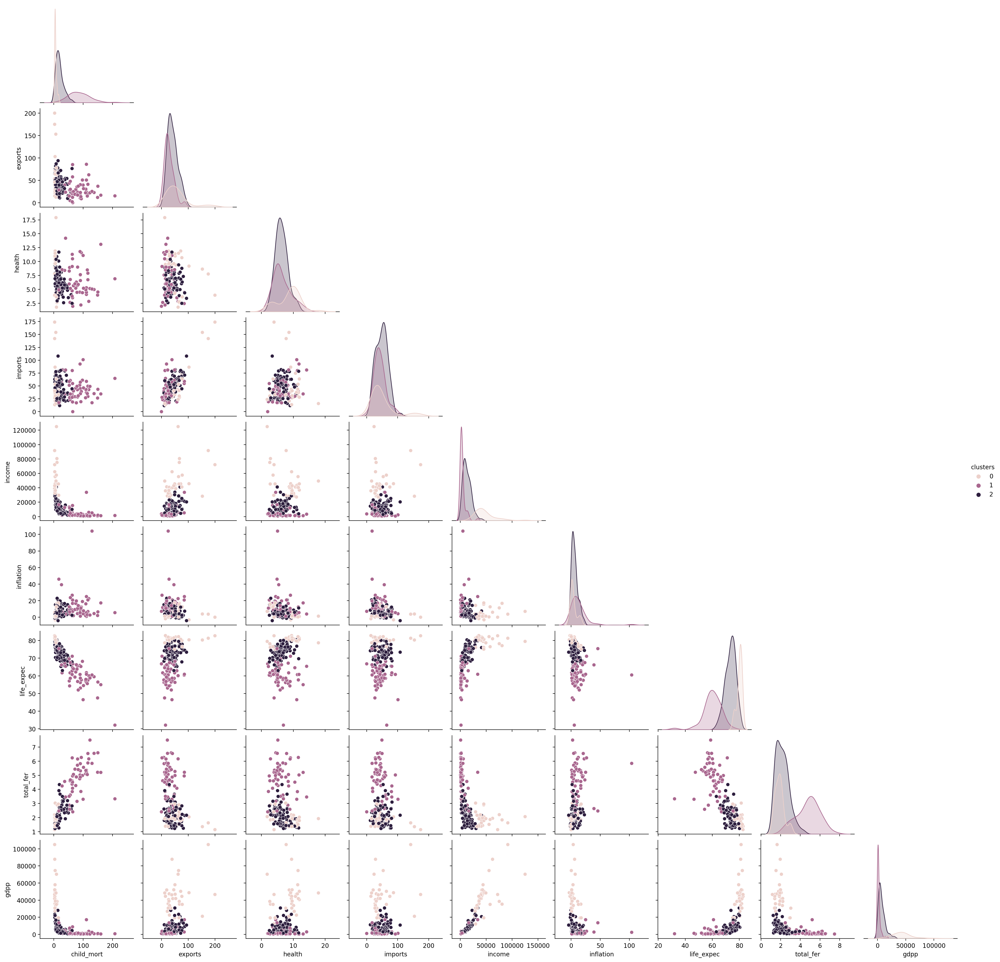

In [52]:
# Lets visualize the relationship between each features based on the clusters
plt.figure(figsize=(20, 60))
sns.pairplot(df_hc_labeled, hue='clusters', corner=True)

In [53]:
cat = {'0': 'Developed Countries (No help needed)', '1': 'Underdeveloped countries (Need the Most Help)', '2': 'Developing Countries (Some Help Needed)'}
fig = px.choropleth(data_frame=df_hc_labeled, 
              locationmode='country names', 
              locations='country', 
              color=df_hc_labeled['clusters'].astype('string'), projection='equirectangular', color_discrete_sequence=['red', 'yellow', 'green'])
fig.update_layout(font=dict(size=8), legend=dict(orientation='h'))
fig.for_each_trace(lambda t: t.update(name = cat[t.name],
                                      legendgroup = cat[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, cat[t.name])
                                     )
                  )

## Mean Shift Clustering

In [54]:
# estimate the bandwidth to use for the mean-shift algorithm
bandwidth = estimate_bandwidth(df_pca_selected, quantile=0.6)
bandwidth

3.832404272288838

In [55]:
# create an instance of the class
ms = MeanShift(bandwidth=bandwidth, bin_seeding=False)

# Fit the instance on the data then predict clusters for the data
ms.fit(df_pca_selected)
ms.predict(df_pca_selected)

df_ms_labeled = df.copy()
df_ms_labeled['clusters'] = ms.labels_

df_ms_labeled.groupby(['clusters', 'country']).mean().sort_values(by=['gdpp'], ascending=True)

child_mort  exports  health  imports     income  \
clusters country                                                             
0        Burundi          93.600      8.920    11.600  39.200   764.000      
         Liberia          89.300      19.100   11.800  92.600   700.000      
         Congo, Dem. Rep. 116.000     41.100   7.910   49.600   609.000      
         Niger            123.000     22.200   5.160   49.100   814.000      
         Sierra Leone     160.000     16.800   13.100  34.500   1220.000     
...                           ...        ...     ...      ...       ...      
         Denmark          4.100       50.500   11.400  43.600   44000.000    
         Qatar            9.000       62.300   1.810   23.800   125000.000   
         Switzerland      4.500       64.000   11.500  53.300   55500.000    
         Norway           3.200       39.700   9.480   28.500   62300.000    
1        Luxembourg       2.800       175.000  7.770   142.000  91700.000    

                           inflation  life_expec  total_fer       gdpp  
clusters country                                                        
0        Burundi          12.300     57.700      6.260      231.000     
         Liberia          5.470      60.800      5.020      327.000     
         Congo, Dem. Rep. 20.800     57.500      6.540      334.000     
         Niger            2.550      58.800      7.490      348.000     
         Sierra Leone     17.200     55.000      5.200      399.000     
...                         ...         ...        ...          ...     
         Denmark          3.220      79.500      1.870      58000.000   
         Qatar            6.980      79.500      2.070      70300.000   
         Switzerland      0.317      82.200      1.520      74600.000   
         Norway           5.950      81.000      1.950      87800.000   
1        Luxembourg       3.620      81.300      1.630      105000.000  

[167 rows x 9 columns]

In [56]:
print(np.unique(ms.labels_))

[0 1 2]


In [57]:
df_ms_labeled.groupby(['clusters']).country.count()

clusters
0    162
1    4  
2    1  
Name: country, dtype: int64

Mean shift clustering algorithm predicted 3 different clusters which is similar to the hierarchical clustering algorithm. There are 162 countries which are group into cluster 0, 4 countries clusters into cluster 1, and 1 country group into cluster 2. It seems that Mean shift clustering did not perform as well as K-means and hierarchical clustering since it clusters are not logical.

In [58]:
df_ms_labeled_pca = df_pca_selected.copy()
df_ms_labeled_pca['clusters'] = ms.labels_


df_ms_labeled_pca

,PC1,PC2,PC3,PC4,PC5,PC6,clusters
0,-2.913,0.096,-0.718,1.005,-0.158,-0.255,0
1,0.430,-0.588,-0.333,-1.161,0.175,0.085,0
2,-0.285,-0.455,1.222,-0.868,0.156,-0.402,0
3,-2.932,1.696,1.525,0.840,-0.273,-0.548,0
4,1.034,0.137,-0.226,-0.847,-0.193,-0.207,0
...,...,...,...,...,...,...,...
162,-0.821,0.640,-0.390,-0.707,-0.396,0.009,0
163,-0.551,-1.234,3.101,-0.115,2.083,0.097,0
164,0.499,1.391,-0.239,-1.074,1.176,0.052,0
165,-1.887,-0.109,1.110,0.056,0.618,-0.541,0


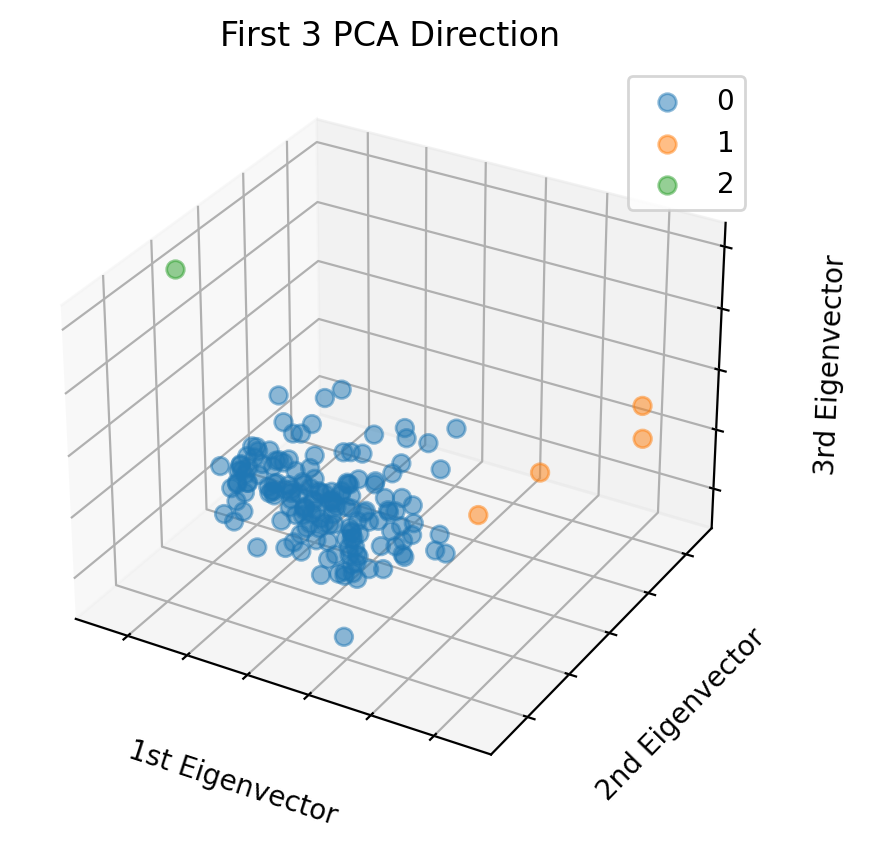

In [59]:
fig = plt.figure()
 
ax = fig.add_subplot(111, projection ='3d')

for cls in np.unique(ms.labels_): 
    ax.scatter(
        df_ms_labeled_pca[df_ms_labeled_pca.clusters==cls].PC1, 
        df_ms_labeled_pca[df_ms_labeled_pca.clusters==cls].PC2,
        df_ms_labeled_pca[df_ms_labeled_pca.clusters==cls].PC3, 
        marker ='o', 
        label=cls, 
        alpha=0.5, 
        s=40, 
        cmap='viridis')

ax.legend()
ax.set_title('First 3 PCA Direction')
ax.set_xlabel('1st Eigenvector')
ax.xaxis.set_ticklabels([])
ax.set_ylabel('2nd Eigenvector')
ax.yaxis.set_ticklabels([])
ax.set_zlabel('3rd Eigenvector')
ax.zaxis.set_ticklabels([])
plt.show()

In [60]:
for cls in np.unique(df_ms_labeled_pca.clusters):
    print(f'Label={cls} consist of the following countries:')
    print(df_ms_labeled[df_ms_labeled.clusters == cls].country.to_list())
    print('-'*50)

Label=0 consist of the following countries:
['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.', 'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Hungary', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakh

It can be seen that Mean shift perform poorly in clustering the data

## DBSCAN
**DBSCAN Clustering** is a density based clustering algorithm that is used for unsupervised learning problems.

- In a bid to eliminate the problems of K-Means Clustering with nested data and high-dimensional data, DBSCAN Clustering eliminates it! It's has 3 important terms & 2 important hyperparameters :
    - Terms :
        - Core Point : It is the center point that has minPts number of data points present in it's area and the points under it's area can extend the cluster.
        - Non-Core Point : It is the center point that does not have minPts number of data points present in it's area and it cannot extend the cluster.
        - Outliers / Noise : It is the data points that are not a part of any cluster.

    - Hyperparameters :
        - minPts : It is the minimum number of data points that need to be present in the area of a point to be considered as a core point.
        - Epsilon : It is the radius of the area of a center point.

- DBSCAN Clustering creates the clusters in the following way :
    - Select a random point and consider it as a center point from the data.
    - Check the other data points that present in the area of this center point with the Epsilon value as it's radius.
    - If this area has minPts number of data points in it, then the center point is considered as a core point.
    - The data points in this area are then considered as core point that further extends by the same rules creating a cluster.
    - If any of the point does not satisfy the rules, it is considered as non-core point that remains the part of the cluster but it cannot extend the cluster further.
    - When all the core points are done with engulfing the other data points, non-core points are included & the cluster is completed.
    - The next cluster then starts forming by the same rules. Some of the points don't be a part of any of the clusters, such points are known as outliers / noise.

- As you might have noticed, the hyperparameters play a crucical role in this process. Thus, they have certain rules for assigning them values :
    - minPts : If D represents the number of dimensions / features of a dataset, then minPts >= D + 1. Typically minPts >= 2 * D is selected for smaller or noisy datasets. The minimum value of MinPts should be chosen at least 3.
    - Epsilon : It's value is usually decided using the k-distance graph that is determined from the KNN model. the optimal value for epsilon is at the point of maximum curvature (ie: where the graph has the greatest slope)
        - https://www.kaggle.com/code/tanmaymane18/nearestneighbors-to-find-optimal-eps-in-dbscan
        - https://www.kaggle.com/code/ranja7/clustering-with-dbscan-compare-with-gmm?scriptVersionId=107998781
        - https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd
        - https://www.reneshbedre.com/blog/dbscan-python.html

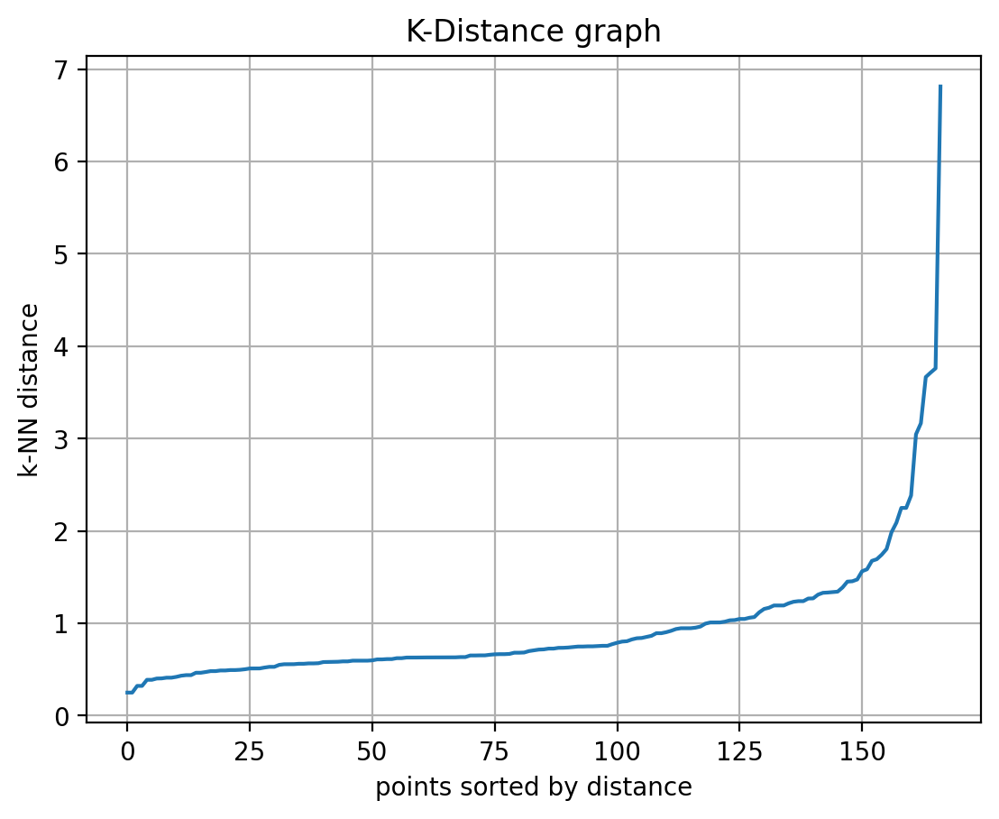

In [61]:
# Selecting the optimal epsilon

# calculate the average distance between each point in the dataset and the defined nearest neighbor
neighbors = NearestNeighbors(n_neighbors=5).fit(df_pca_selected)

# Find hte k-neighbors of a point
distances, indices = neighbors.kneighbors(df_pca_selected)

# sort the ditance values by ascending value and plot
# axis = 0 represents sort along first axis i.e. sort along row
distances = np.sort(distances, axis=0)

# get the sorted kth column (distance with kth neighbors) and plot the kNN distance plot
k_dist = distances[:, 1]
plt.plot(k_dist)
plt.ylabel('k-NN distance')
plt.xlabel('points sorted by distance')
plt.title('K-Distance graph')
plt.grid()

The knee can occur between point 1 to 3. ie. the points below the knee point belong to a cluster, and the points above the knee point are noise or outlier (noise points will have higher kNN distance). Hence, run DBSCAN based on different value of $\varepsilon$ (between 1 to 3) to find best $\varepsilon$ that gives the best clustering

1.4515617221448038


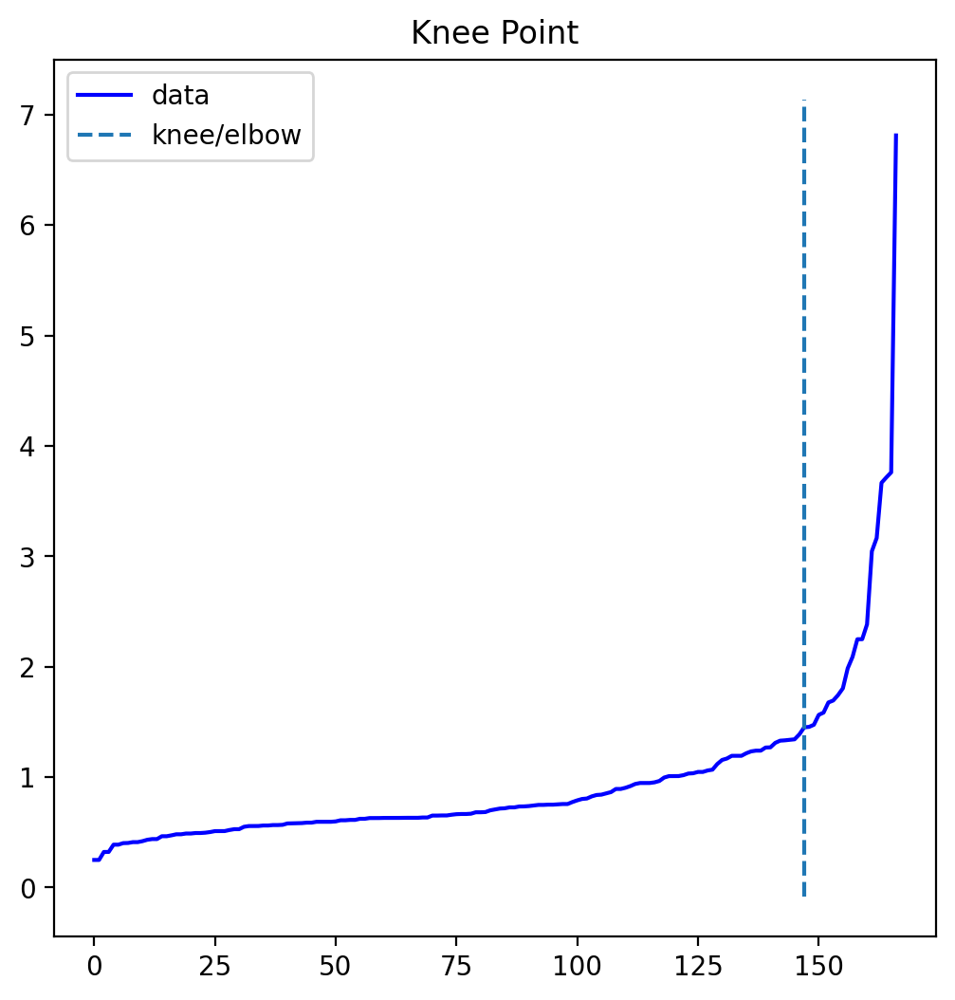

In [62]:
# get the estimate of the knee point using KneeLocator() function from kneed package
kneedle = KneeLocator(x=np.arange(len(distances)), 
                      y=k_dist, 
                      S=1.0, 
                      curve='convex', 
                      direction='increasing',  
                      interp_method='polynomial')

# get the estimate of knee point
print(kneedle.knee_y)

# distance plot
kneedle.plot_knee()
plt.show()

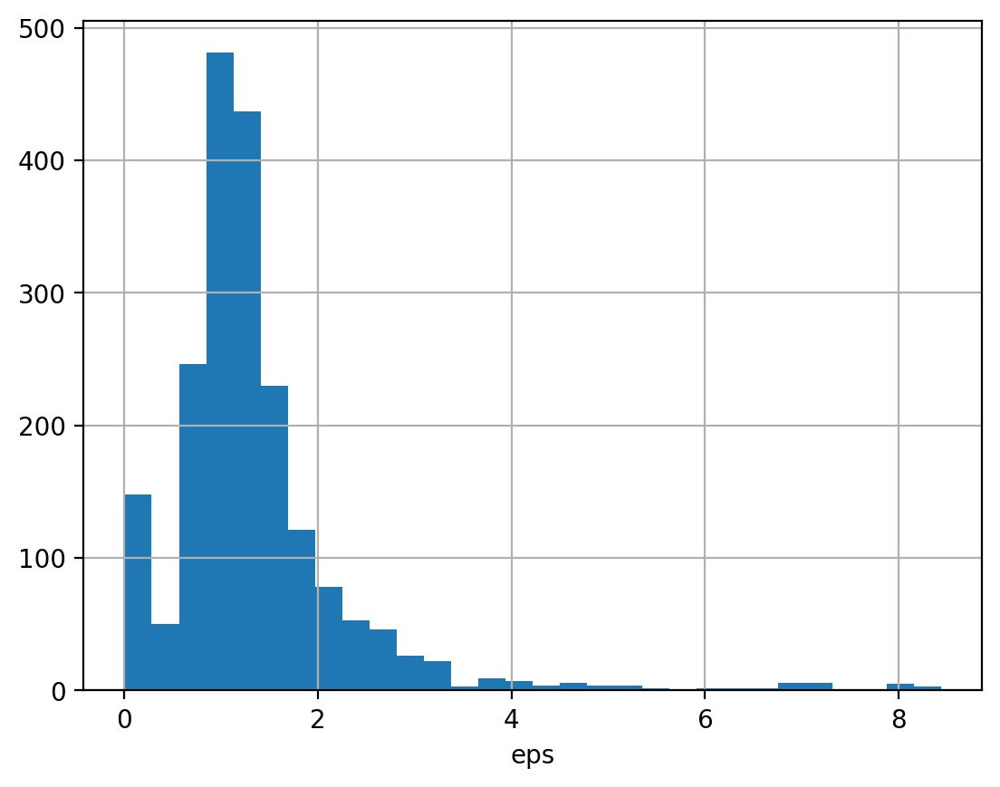

In [63]:
def k_distances2(x, k):
    """ Function to calculate distance of each point to its k-th NN 
        x: dataset
        k: #NN
    """
    
    dim0 = x.shape[0]
    dim1 = x.shape[1]
    p = -2*x.dot(x.T) + np.sum(x**2, axis = 1).T + np.repeat(np.sum(x**2, axis = 1),dim0, axis = 0).reshape(dim0,dim0)
    p = np.sqrt(p) #EUCLIDEAN DISTANCE
    p.sort(axis = 1)
    p = p[:,:k]
    pm = np.sort(p.flatten())
    
    return p, pm

m, m2 = k_distances2(df_pca_selected.values, 12)

plt.hist(m2, bins = 30)
plt.xlabel('eps') #epsilon distance
plt.grid(True)

Majority of points lie within 3 units from their NNs. Hence eps=3

In [64]:
# lets consider eps range 2 to 4 and min_sample range 10 to 21 
# and iterate over these combinations and get the best silhouette score

min_samples = range(7, 9)
eps = np.arange(1, 3, 0.25)

In [65]:
output = []
for ms in min_samples:
    for ep in eps:
        labels = DBSCAN(min_samples=ms, eps=ep).fit(df_sc).labels_
        score = silhouette_score(df_sc, labels)
        cls_size = np.bincount(labels+1)
        output.append((ms, ep, score, cls_size, np.unique(labels)))
df_plt = pd.DataFrame(output, columns=['min_sample', 'eps', 'sc', 'cluster_size', 'labels'])
df_plt

,min_sample,eps,sc,cluster_size,labels
0,7,1.000,-0.020,"[118, 39, 10]","[-1, 0, 1]"
1,7,1.250,0.125,"[56, 21, 72, 18]","[-1, 0, 1, 2]"
2,7,1.500,0.280,"[31, 136]","[-1, 0]"
3,7,1.750,0.329,"[24, 143]","[-1, 0]"
4,7,2.000,0.396,"[17, 150]","[-1, 0]"
5,7,2.250,0.451,"[11, 156]","[-1, 0]"
6,7,2.500,0.558,"[6, 161]","[-1, 0]"
7,7,2.750,0.558,"[6, 161]","[-1, 0]"
8,8,1.000,-0.171,"[123, 28, 10, 6]","[-1, 0, 1, 2]"
9,8,1.250,0.118,"[58, 71, 18, 20]","[-1, 0, 1, 2]"


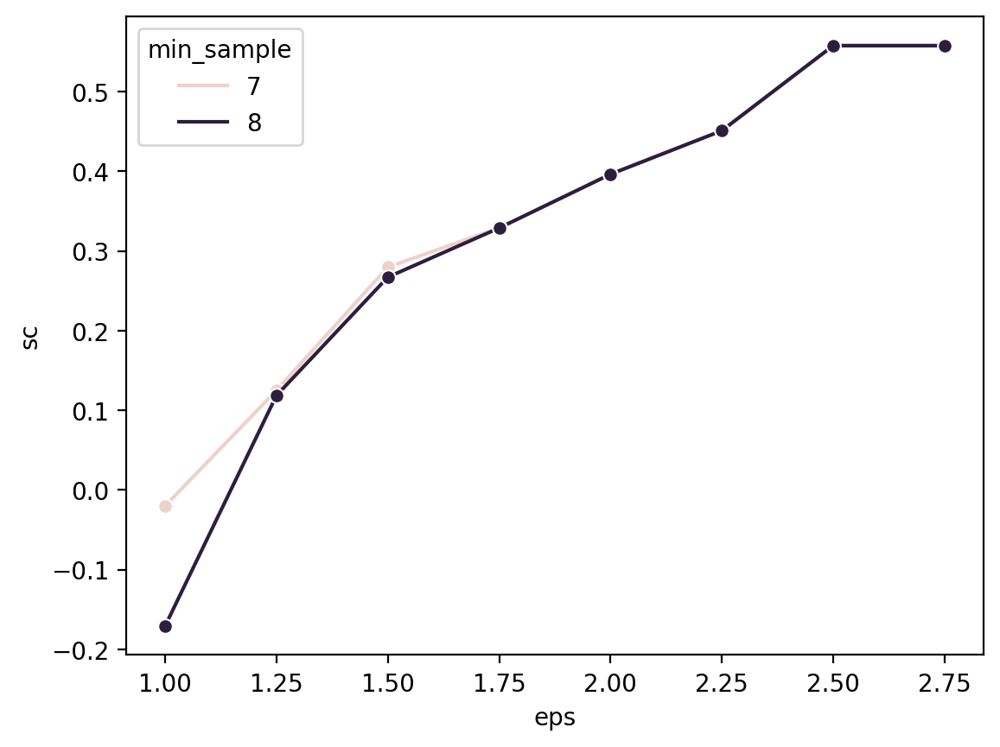

In [66]:
sns.lineplot(df_plt, x='eps', y='sc', marker='o', hue='min_sample')
plt.show()

In [67]:
# get the parameter with the best silhouette score
best_min_samples, best_eps, best_score = sorted([v[:-2] for v in output], key=lambda x:x[-1])[-1]
print(f"Best silhouette_score: {best_score}")
print(f"min_samples: {best_min_samples}")
print(f"eps: {best_eps}")

Best silhouette_score: 0.5576815439859409
min_samples: 8
eps: 2.75


In [68]:
# get the number of clusters and outliers from DBSCAN with the best parameter
ds = DBSCAN(eps=2.75, min_samples=8).fit(df_pca_selected)

# Get the number of cluster
print(np.unique(ds.labels_))

# Get the number of noise
(ds.labels_==-1).sum()

[-1  0]


6

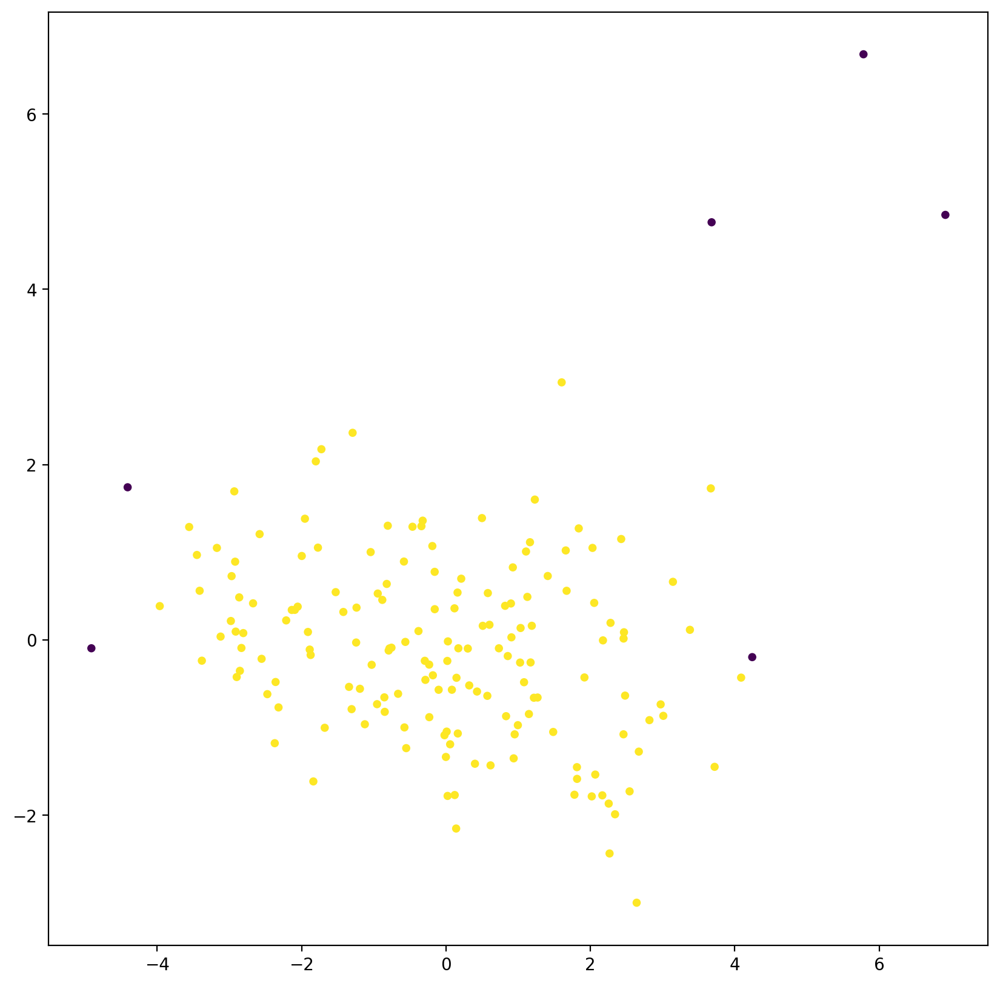

In [69]:
df_db_labeled_pca = df_pca_selected.copy()
df_db_labeled_pca['labels'] = ds.labels_


plt.figure(figsize=(10, 10))
plt.scatter(df_pca_selected.PC1, df_pca_selected.PC2, c=df_db_labeled_pca['labels'], s=15)
plt.show()

# Summary

Comparing all 4 clustering methods, we can see that K-Means and Hierarchical clustering perform quite well. Both K-means and hierarchical clustering were able to distinctly cluster the data into 4 and 3 groups respectively. These clustering method gave an insight on how the countries were group, either by development status or economic status.

Mean shift clustering and DBSCAN however did not perform well. Both clustering methods were not able to successfully group the data by economy or by development status.

# Suggestion for Next Step
1. To use feature transformation to improve on the clustering
2. To group the data into 3 seperate features by taking the mean to get a better clustering:
    - health: child_mort, health, life_expec, total_fer
    - trade: imports, exports
    - finance: income, inflation, gdpp

# Optional - Grouping by Health, Trade and Finance

In [77]:
df1 = pd.DataFrame()
df1['Health'] = (df['child_mort'] / df['child_mort'].mean()) + (df['health'] / df['health'].mean()) + (df['life_expec'] / df['life_expec'].mean()) + (df['total_fer'] / df['total_fer'].mean())
df1['Trade'] = (df['imports'] / df['imports'].mean()) + (df['exports'] / df['exports'].mean())
df1['Finance'] = (df['income'] / df['income'].mean()) + (df['inflation'] / df['inflation'].mean()) + (df['gdpp'] / df['gdpp'].mean())
df1.head()

,Health,Trade,Finance
0,6.240,1.201,1.350
1,3.036,1.718,1.472
2,3.390,1.604,3.165
3,6.469,2.430,3.495
4,2.965,2.363,2.240


In [78]:
data_scale = MinMaxScaler().fit_transform(df1)
df1 = pd.DataFrame(np.c_[df.iloc[:, 0], data_scale], columns=['Country'] + df1.columns.to_list())
df1

,Country,Health,Trade,Finance
0,Afghanistan,0.626,0.140,0.080
1,Albania,0.127,0.200,0.089
2,Algeria,0.182,0.187,0.213
3,Angola,0.661,0.283,0.237
4,Antigua and Barbuda,0.116,0.275,0.145
...,...,...,...,...
162,Vanuatu,0.217,0.263,0.035
163,Venezuela,0.133,0.124,0.560
164,Vietnam,0.170,0.403,0.121
165,Yemen,0.397,0.170,0.230


In [82]:
m1=df1.iloc[:, 1:]

Text(0.5, 1.0, 'K-Distance Graph')

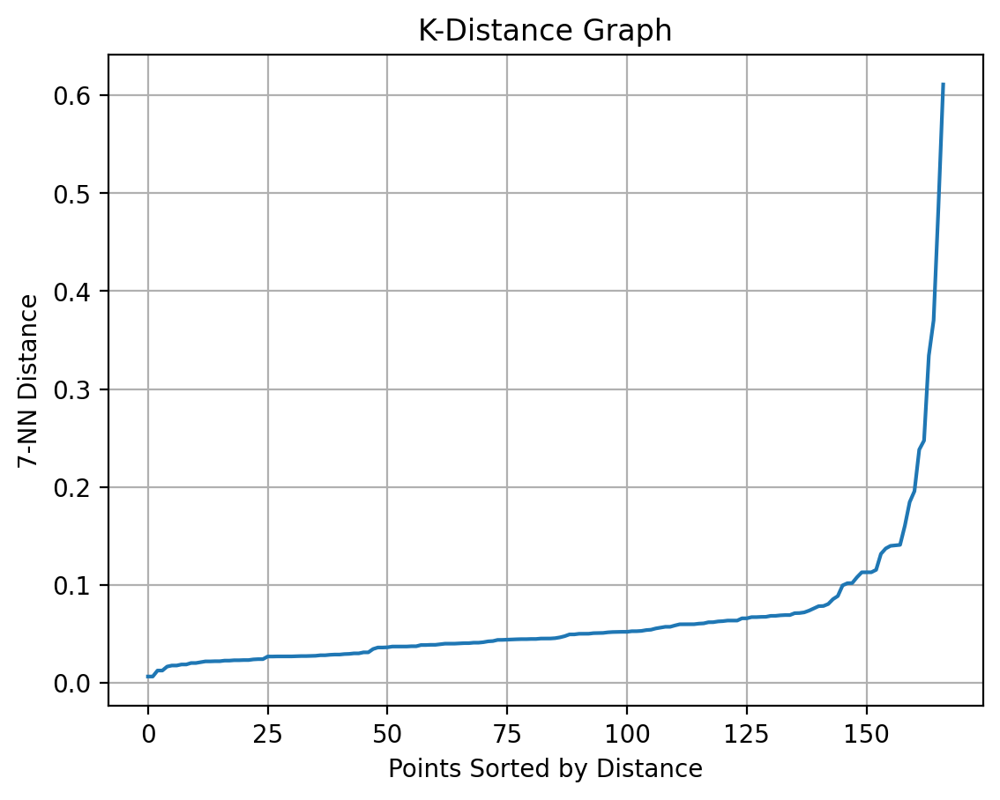

In [119]:
knn = NearestNeighbors(n_neighbors=7)
model = knn.fit(m1)
neigh_dist, neigh_ind = knn.kneighbors(m1)
distances = np.sort(neigh_dist, axis=0)
k_dist = distances[:, 1]
plt.grid()
plt.plot(k_dist)
plt.xlabel('Points Sorted by Distance')
plt.ylabel('7-NN Distance')
plt.title('K-Distance Graph')

In [171]:
db = DBSCAN(eps=0.0805, min_samples=8).fit(m1)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
pd.DataFrame(db.labels_).value_counts()

 0    86
-1    65
 1    8 
 2    8 
dtype: int64

There are 38 outliers, 108 countries that are in cluster 1 and 21 countries that are in cluster 2

In [172]:
df1['clusters'] = db.labels_
for cls in np.unique(df1.clusters):
    print(f'Label={cls} consist of the following countries:')
    print(df_ms_labeled[df1.clusters == cls].country.to_list())
    print('-'*50)

Label=-1 consist of the following countries:
['Angola', 'Australia', 'Bahrain', 'Belarus', 'Belgium', 'Benin', 'Botswana', 'Brunei', 'Burkina Faso', 'Burundi', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.', "Cote d'Ivoire", 'Cyprus', 'Denmark', 'Equatorial Guinea', 'France', 'Gabon', 'Ghana', 'Guinea-Bissau', 'Haiti', 'Iraq', 'Ireland', 'Kenya', 'Kiribati', 'Kuwait', 'Lao', 'Lesotho', 'Liberia', 'Libya', 'Luxembourg', 'Madagascar', 'Mali', 'Malta', 'Mauritania', 'Micronesia, Fed. Sts.', 'Myanmar', 'Namibia', 'Netherlands', 'Niger', 'Nigeria', 'Norway', 'Oman', 'Pakistan', 'Qatar', 'Rwanda', 'Senegal', 'Seychelles', 'Sierra Leone', 'Singapore', 'Slovenia', 'South Korea', 'Sudan', 'Switzerland', 'Timor-Leste', 'Togo', 'United Arab Emirates', 'United States', 'Venezuela', 'Vietnam', 'Yemen']
--------------------------------------------------
Label=0 consist of the following countries:
['Albania', 'Algeria', 'Antigua and Barbuda', 'Argentina',

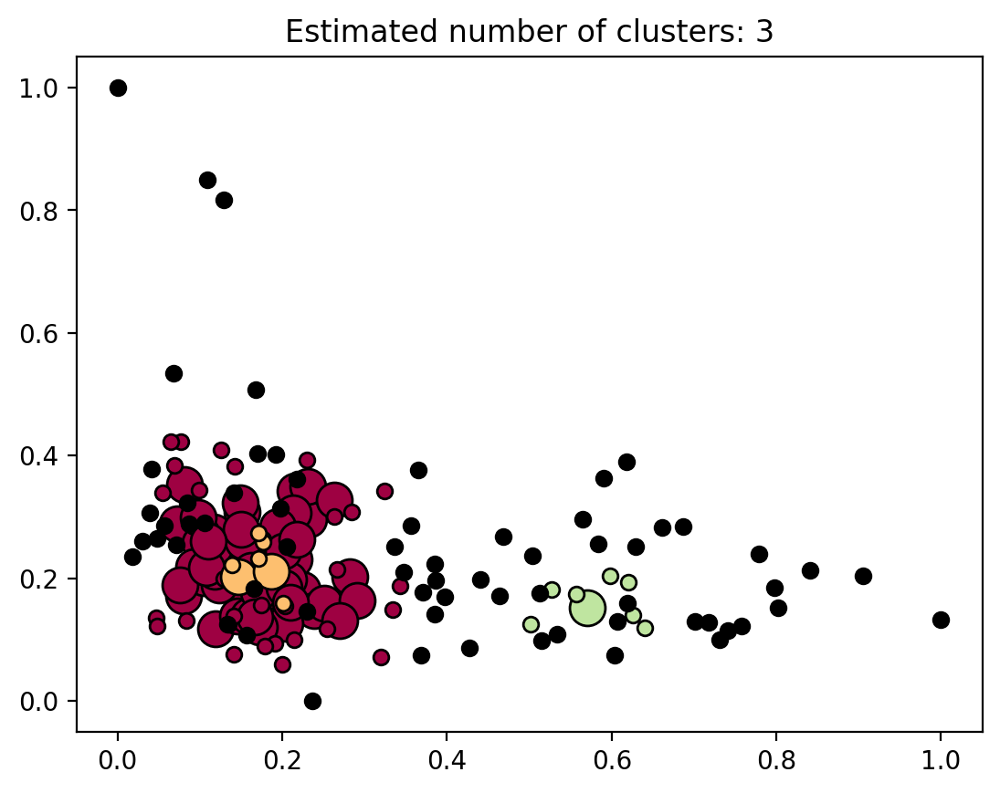

In [176]:
unique_labels = set(df1.clusters)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]
    class_member_mask = df1.clusters == k

    xy = m1[class_member_mask & core_samples_mask]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], "o", markerfacecolor = tuple(col), markeredgecolor = "k", markersize = 14)

    xy = m1[class_member_mask & ~core_samples_mask]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], "o", markerfacecolor = tuple(col), markeredgecolor = "k", markersize = 6)

plt.title("Estimated number of clusters: %d" % len(np.unique(db.labels_[db.labels_>-1])))
plt.show()